In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import pearsonr
import ast
from collections import Counter
from sklearn.linear_model import LogisticRegression
import os
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
# %matplotlib widget


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def set_nature_neuro_style(fig, ax):
    """
    Adjusts matplotlib figure and axes style.

    Parameters:
        fig : matplotlib.figure.Figure
        ax  : matplotlib.axes.Axes or np.ndarray of Axes
    """
    fig.set_size_inches(2.5, 2.5)  # standard single-column width

    # Update global font and style
    plt.rcParams.update({
        'font.family': 'Arial',
        'axes.labelsize': 7,
        'axes.titlesize': 8,
        'xtick.labelsize': 7,
        'ytick.labelsize': 7,
        'legend.fontsize': 7
    })

    # Handle array of axes
    axes = ax.flatten() if isinstance(ax, np.ndarray) else [ax]

    for a in axes:
        # Hide top and right spines
        for spine in ['top', 'right']:
            a.spines[spine].set_visible(False)
        for spine in ['left', 'bottom']:
            a.spines[spine].set_linewidth(0.75)

        a.tick_params(direction='in', length=2, width=0.5, top=False, right=False)

        # legend样式调整
        leg = a.get_legend()
        if leg is not None:
            leg.get_frame().set_linewidth(0.5)
            for lh in leg.get_lines():
                lh.set_linewidth(1.0)   # 缩小线条宽度
                lh.set_markersize(3.0)  # 缩小marker大小

    fig.tight_layout()
    fig.canvas.draw_idle()
    return fig, ax

### Task distribution

pA: [0.0945 0.0945 0.0945 0.0945 0.0945 0.0945 0.0945 0.0945 0.0596 0.0474
 0.0376 0.0299 0.0237 0.0189 0.015  0.0119]
pB: [0.0119 0.015  0.0189 0.0237 0.0299 0.0376 0.0474 0.0596 0.0945 0.0945
 0.0945 0.0945 0.0945 0.0945 0.0945 0.0945]
log10(p(x|A)/p(x|B)) = [ 0.9  0.8  0.7  0.6  0.5  0.4  0.3  0.2 -0.2 -0.3 -0.4 -0.5 -0.6 -0.7
 -0.8 -0.9]


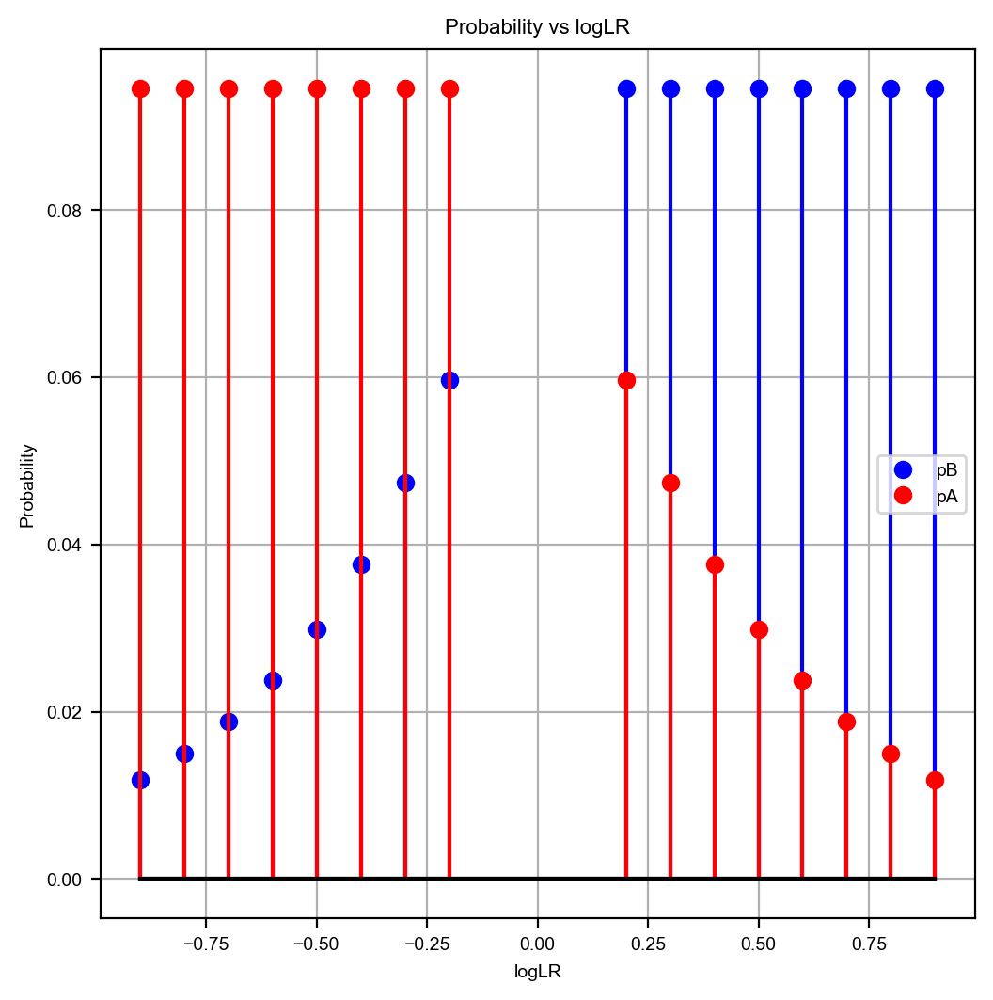

In [22]:
# def build_sptr_distributions(logLRs):
#     N = len(logLRs)
#     logLRs = np.array(logLRs)

#     # 划分索引
#     left  = np.where(logLRs < 0)[0]
#     right = np.where(logLRs > 0)[0]

#     # 初始化
#     p_A = np.zeros(N)
#     p_B = np.zeros(N)

#     # Target A：左侧均匀，右侧 exp(-lr) 衰减
#     p_A[left] = 1.0 / N
#     raw_A_right = np.exp(-logLRs[right])
#     p_A[right] = raw_A_right / raw_A_right.sum() * (len(right) / N)

#     # Target B：右侧均匀，左侧 exp(+lr) 衰减
#     p_B[right] = 1.0 / N
#     raw_B_left = np.exp(logLRs[left])
#     p_B[left] = raw_B_left / raw_B_left.sum() * (len(left) / N)

#     return p_A, p_B

# 1) 目标 log10LR 序列：左正右负
lr_left  = np.array([+0.9, +0.8, +0.7, +0.6,
                     +0.5, +0.4, +0.3, +0.2])
lr_right = -lr_left[::-1]            # -0.2 … -0.9
logLRs = np.concatenate([lr_left, lr_right])

nL, nR = len(lr_left), len(lr_right)

# 2) 预计算 10 的幂和
S_L = np.sum(10 ** (-lr_left))   # Σ 10^(−L_i)
S_R = np.sum(10 ** ( lr_right))  # Σ 10^( R_j)

# 3) 求 c_A, c_B
A = np.array([[1,        S_R / nR],
              [S_L / nL, 1       ]])
cA, cB = np.linalg.solve(A, np.ones(2))

# 4) 生成完整分布
pA = np.empty(nL + nR)
pB = np.empty_like(pA)

# 左侧：pA 均匀，pB 由 LR 决定
pA[:nL] = cA / nL
pB[:nL] = pA[:nL] * 10 ** (-lr_left)

# 右侧：pB 均匀，pA 由 LR 决定
pB[nL:] = cB / nR
pA[nL:] = pB[nL:] * 10 ** ( lr_right)

# 5) 验证
assert np.isclose(pA.sum(), 1) and np.isclose(pB.sum(), 1)
assert np.allclose(np.log10(pA / pB),
                   np.r_[lr_left, lr_right])
print("pA:", np.round(pA, 4))
print("pB:", np.round(pB, 4))

# 用法示例
# logLRs = [-0.9, -0.8, -0.7, -0.6, -0.5, -0.4, -0.3, -0.2,
#            0.2,  0.3,  0.4,  0.5,  0.6,  0.7,  0.8,  0.9]
# p_A, p_B = build_sptr_distributions(logLRs)
# print("p(x|A) =", np.round(pA, 4))
# print("p(x|B) =", np.round(pB, 4))
print("log10(p(x|A)/p(x|B)) =", np.round(np.log10(pA/pB), 4))

# plot the pA and pB
plt.figure(figsize=(6, 6))
markerline1, stemlines1, baseline1 = plt.stem(logLRs, pA, linefmt='b-', markerfmt='bo', basefmt='k-')
markerline2, stemlines2, baseline2 = plt.stem(logLRs, pB, linefmt='r-', markerfmt='ro', basefmt='k-')

# Set labels for the legend
markerline1.set_label('pB')
markerline2.set_label('pA')

plt.xlabel('logLR')
plt.ylabel('Probability')
plt.title('Probability vs logLR')
plt.grid(True)
plt.legend()

plt.show()

ell: [-0.9        -0.64285714 -0.38571429 -0.12857143  0.12857143  0.38571429
  0.64285714  0.9       ]
pA: [0.0714 0.1148 0.1847 0.2971 0.221  0.076  0.0261 0.009 ]
pB: [0.009  0.0261 0.076  0.221  0.2971 0.1847 0.1148 0.0714]
log10(pA/pB): [ 0.9    0.643  0.386  0.129 -0.129 -0.386 -0.643 -0.9  ]
[0.07136985 0.11480757 0.18468271 0.29708587 0.22095842 0.07598222
 0.02612843 0.00898493]
[0.00898493 0.02612843 0.07598222 0.22095842 0.29708587 0.18468271
 0.11480757 0.07136985]


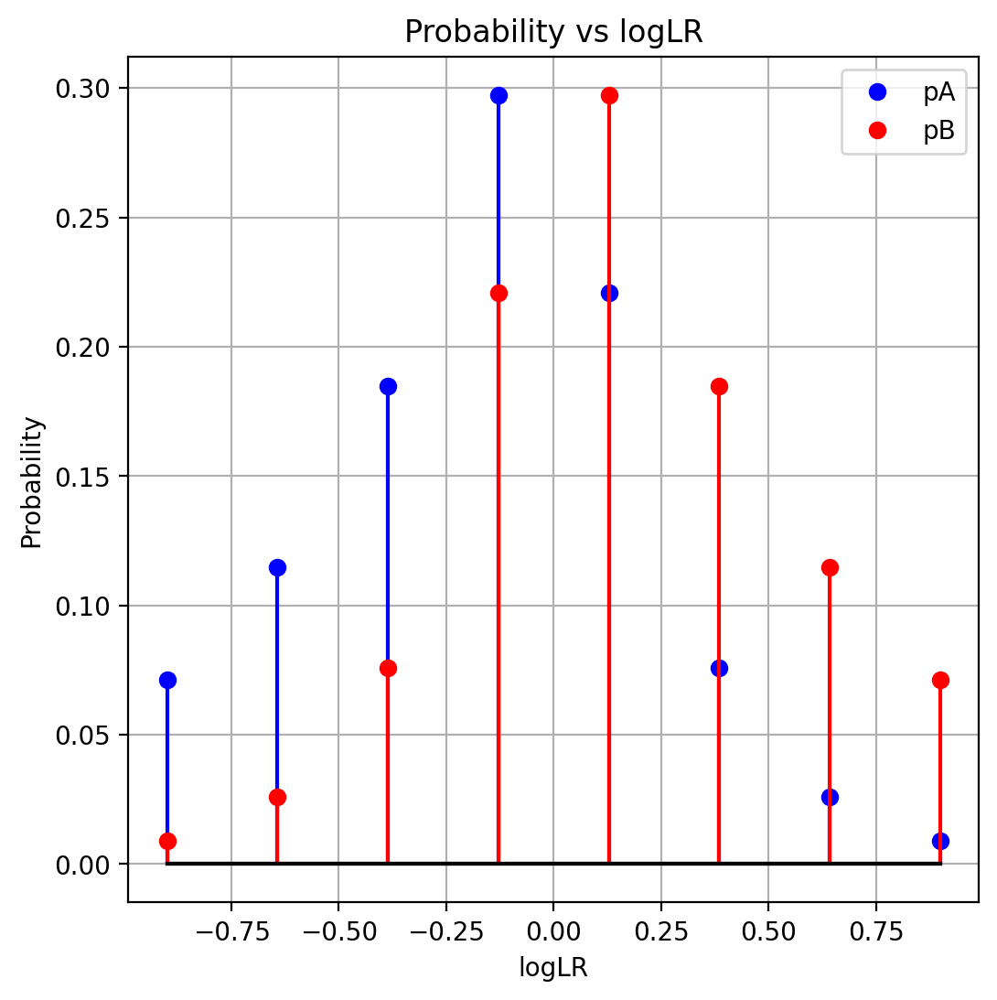

check     : [ 1.8         1.28571429  0.77142857  0.25714286 -0.25714286 -0.77142857
 -1.28571429 -1.8       ]
sum pA/pB : 0.9999999999999999 0.9999999999999999


In [2]:
# ell = np.array([-0.9,-0.5,-0.3, -0.1, 0.1, 0.3,0.5,0.9])
# ell = np.linspace(-0.4, 0.4, 16)
ell = np.linspace(-0.9, 0.9, 8)
print("ell:", ell)

# logLR_pos = np.random.uniform(0.05, 0.95, size=8)
# logLR_pos.sort()
# logLR_neg = -logLR_pos[::-1]
# ell = np.concatenate([logLR_neg, logLR_pos])

lam = 3.0
w   = 10**(ell/2) * np.exp(-lam*np.abs(ell))
pB  = w / w.sum()
pA  = pB[::-1]
print("pA:", np.round(pA,4))
print("pB:", np.round(pB,4))
print("log10(pA/pB):", np.round(np.log10(pA/pB),3))

print(pA)
print(pB)
# plot the pA and pB
plt.figure(figsize=(6, 6))
markerline1, stemlines1, baseline1 = plt.stem(ell, pA, linefmt='b-', markerfmt='bo', basefmt='k-')
markerline2, stemlines2, baseline2 = plt.stem(ell, pB, linefmt='r-', markerfmt='ro', basefmt='k-')

# Set labels for the legend
markerline1.set_label('pA')
markerline2.set_label('pB')

plt.legend()
plt.grid(True)
plt.xlabel('logLR')
plt.ylabel('Probability')
plt.title('Probability vs logLR')
plt.legend()
plt.show()
print("check     :", np.round(np.log10(pA / pB) - ell, 14))
print("sum pA/pB :", pA.sum(), pB.sum())

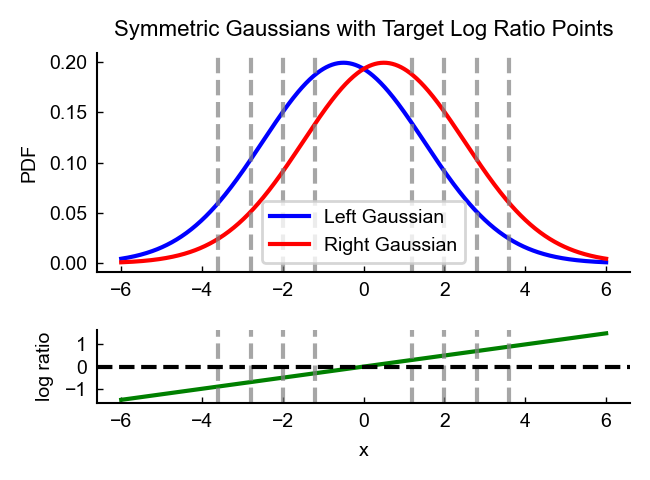

In [24]:
from scipy.stats import norm

# Parameters for the symmetric Gaussians
mu = 0.5   # distance from y=0
sigma = 2.0
x = np.linspace(-6, 6, 500)

# Two symmetric Gaussian PDFs
pdf_left = norm.pdf(x, -mu, sigma)
pdf_right = norm.pdf(x, mu, sigma)

# Log ratio of PDFs
log_ratio = np.log(pdf_right / pdf_left)

# Define target log ratio values
target_log_ratios = np.array([-0.9, -0.7, -0.5, -0.3, 0.3, 0.5, 0.7, 0.9])

# Find corresponding x values by interpolation
x_targets = np.interp(target_log_ratios, log_ratio, x)

# Plot with vertical lines at target x values
fig, ax = plt.subplots(2, 1, figsize=(6, 6), gridspec_kw={'height_ratios': [3, 1]})

# Top plot: PDFs
ax[0].plot(x, pdf_left, label='Left Gaussian', color='blue')
ax[0].plot(x, pdf_right, label='Right Gaussian', color='red')
for xt in x_targets:
    ax[0].axvline(xt, color='gray', linestyle='--', alpha=0.7)
ax[0].set_ylabel('PDF')
ax[0].legend()
ax[0].set_title('Symmetric Gaussians with Target Log Ratio Points')

# Bottom plot: Log ratio
ax[1].plot(x, log_ratio, color='green')
for xt in x_targets:
    ax[1].axvline(xt, color='gray', linestyle='--', alpha=0.7)
ax[1].axhline(0, color='black', linestyle='--')
ax[1].set_xlabel('x')
ax[1].set_ylabel('log ratio')

plt.tight_layout()

set_nature_neuro_style(fig, ax)
plt.show()

# save the figure to svg
fig.savefig('symmetric_gaussians_with_target_log_ratio_points.svg', dpi=300, bbox_inches='tight')

### Load Data

In [52]:
# path = os.getcwd() + '/results/exp_4/'
path = '/Users/lijialin/Desktop/Research/SPRT/OriginalSPRT/results/exp_sample_cost=0.05_urgency_cost=0.01_logLR=[-0.9,0.9]/'

df= pd.read_json(path + 'data.json', lines=True)
df.head()

,episode,correct_answer,stimuli_so_far,current_stimulus,action,reward,policy,hidden_state
0,0,1,[],-1,2,-0.05,"[2.97438e-05, 3.96241e-05, 0.9999306202]","[0.48027428980000003, -0.2562673092, 0.3711019..."
1,0,1,[5],5,2,-0.06,"[1.7e-08, 3.13539e-05, 0.9999686480000001]","[0.6129333377, -0.2464112937, -0.5344952941000..."
2,0,1,"[5, 4]",4,2,-0.07,"[4.1800000000000004e-08, 0.0008245662000000001...","[0.4195391536, -0.2442313731, -0.4529969394, 0..."
3,0,1,"[5, 4, 4]",4,2,-0.08,"[4.13e-08, 0.0072386418, 0.9927613735]","[0.4163249731, -0.2411135137, -0.5588402152, 0..."
4,0,1,"[5, 4, 4, 4]",4,2,-0.09,"[4.16e-08, 0.0521478653, 0.9478521347000001]","[0.4147548676, -0.23804342750000002, -0.664783..."


In [53]:
correct_data = df[df["correct_answer"] == df["action"]].copy()

print(len(correct_data))
correct_data_0 = correct_data[correct_data["correct_answer"] == 0]
correct_data_1 = correct_data[correct_data["correct_answer"] == 1]
print(len(correct_data_0))
print(len(correct_data_1))

correct_data


28060
13967
14093


,episode,correct_answer,stimuli_so_far,current_stimulus,action,reward,policy,hidden_state
5,0,1,"[5, 4, 4, 4, 5]",5,1,10.0,"[3.7e-09, 0.7627325654, 0.23726746440000002]","[0.5196812749, -0.23417007920000002, -0.790941..."
8,1,0,"[2, 0]",0,0,10.0,"[0.5435290933, 1.9e-09, 0.4564709663]","[-0.0098931585, -0.3579614162, 0.8383913040000..."
16,2,0,"[3, 4, 3, 3, 5, 0, 1]",1,0,10.0,"[0.9346830845, 1.1000000000000001e-09, 0.06531...","[-0.0678588152, -0.5891023874, 0.7927939892, 0..."
19,3,1,"[4, 7]",7,1,10.0,"[7.4e-09, 0.2680760324, 0.7319239378]","[0.6644068360000001, -0.24841944870000002, -0...."
23,4,1,"[6, 7, 5]",5,1,10.0,"[1e-10, 0.9504228830000001, 0.0495770909]","[0.5309756398000001, -0.2522401512, -0.9786083..."
...,...,...,...,...,...,...,...,...
241576,29995,1,"[4, 7, 6]",6,1,10.0,"[2e-10, 0.9620417953, 0.0379582085]","[0.4923859239, -0.24779808520000002, -0.948909..."
241581,29996,0,"[2, 0, 3, 3]",3,0,10.0,"[0.5993204713, 6.9000000000000006e-09, 0.40067...","[0.2618918717, -0.5779919624000001, 0.54582279..."
241586,29997,0,"[2, 3, 3, 0]",0,0,10.0,"[0.9322431087, 3e-10, 0.0677568316]","[-7.17789e-05, -0.46111434700000004, 0.8472669..."
241590,29998,1,"[5, 5, 6]",6,1,10.0,"[7.000000000000001e-10, 0.8701041341, 0.129895...","[0.487653017, -0.24255235490000002, -0.8885897..."


### Distribution of decision time

In [54]:
# show the first episode
df[df['episode'] == 0]

,episode,correct_answer,stimuli_so_far,current_stimulus,action,reward,policy,hidden_state
0,0,1,[],-1,2,-0.05,"[2.97438e-05, 3.96241e-05, 0.9999306202]","[0.48027428980000003, -0.2562673092, 0.3711019..."
1,0,1,[5],5,2,-0.06,"[1.7e-08, 3.13539e-05, 0.9999686480000001]","[0.6129333377, -0.2464112937, -0.5344952941000..."
2,0,1,"[5, 4]",4,2,-0.07,"[4.1800000000000004e-08, 0.0008245662000000001...","[0.4195391536, -0.2442313731, -0.4529969394, 0..."
3,0,1,"[5, 4, 4]",4,2,-0.08,"[4.13e-08, 0.0072386418, 0.9927613735]","[0.4163249731, -0.2411135137, -0.5588402152, 0..."
4,0,1,"[5, 4, 4, 4]",4,2,-0.09,"[4.16e-08, 0.0521478653, 0.9478521347000001]","[0.4147548676, -0.23804342750000002, -0.664783..."
5,0,1,"[5, 4, 4, 4, 5]",5,1,10.00,"[3.7e-09, 0.7627325654, 0.23726746440000002]","[0.5196812749, -0.23417007920000002, -0.790941..."


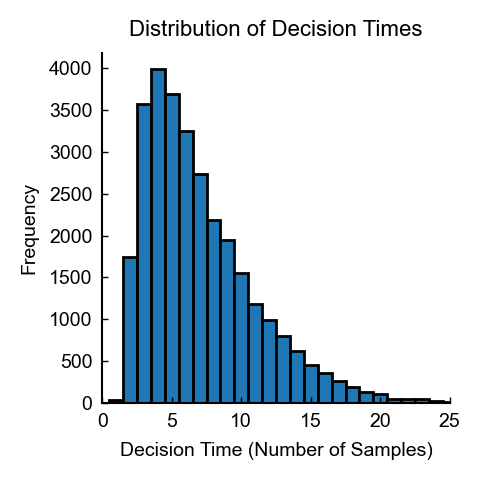

In [55]:
# calculate decision time as the number of samples before the agent makes a decision


episode_lengths = df.groupby('episode').size().reset_index(name='decision_time')
df = df.merge(episode_lengths, on='episode', how='left')
df["decision_time"] = df["decision_time"] - 1

df_decision = df[df["action"] != 2].dropna(subset=["decision_time"])

# 用 subplots 创建 fig, ax
fig, ax = plt.subplots(figsize=(6, 5))

# 绘制直方图
ax.hist(df_decision["decision_time"], 
        bins=range(1, int(df_decision["decision_time"].max()) + 2),
        edgecolor='black', align='left')

ax.set_xlabel("Decision Time (Number of Samples)")
ax.set_ylabel("Frequency")
ax.set_title("Distribution of Decision Times")
# ax.grid(True)
ax.set_xlim(0, 25)

fig, ax = set_nature_neuro_style(fig, ax)

plt.show()

### Cumulative Log LR

                   mean           std  count           sem
decision_time                                             
0              0.000000           NaN      1  0.000000e+00
1             -0.900000  0.000000e+00      3  0.000000e+00
2             -1.453073  2.454816e-01    358  1.297411e-02
3             -1.582185  2.945615e-01   1020  9.223079e-03
4             -1.620959  3.110596e-01   1340  8.497502e-03
5             -1.652902  3.332673e-01   1499  8.607796e-03
6             -1.638316  3.299558e-01   1425  8.740742e-03
7             -1.629208  3.370439e-01   1346  9.186792e-03
8             -1.625510  3.358310e-01   1148  9.911739e-03
9             -1.611272  3.331389e-01   1043  1.031533e-02
10            -1.592542  3.424646e-01    885  1.151182e-02
11            -1.555538  3.523455e-01    730  1.304089e-02
12            -1.517829  3.526186e-01    637  1.397126e-02
13            -1.476955  3.824265e-01    517  1.681910e-02
14            -1.425024  3.578446e-01    443  1.700171e-

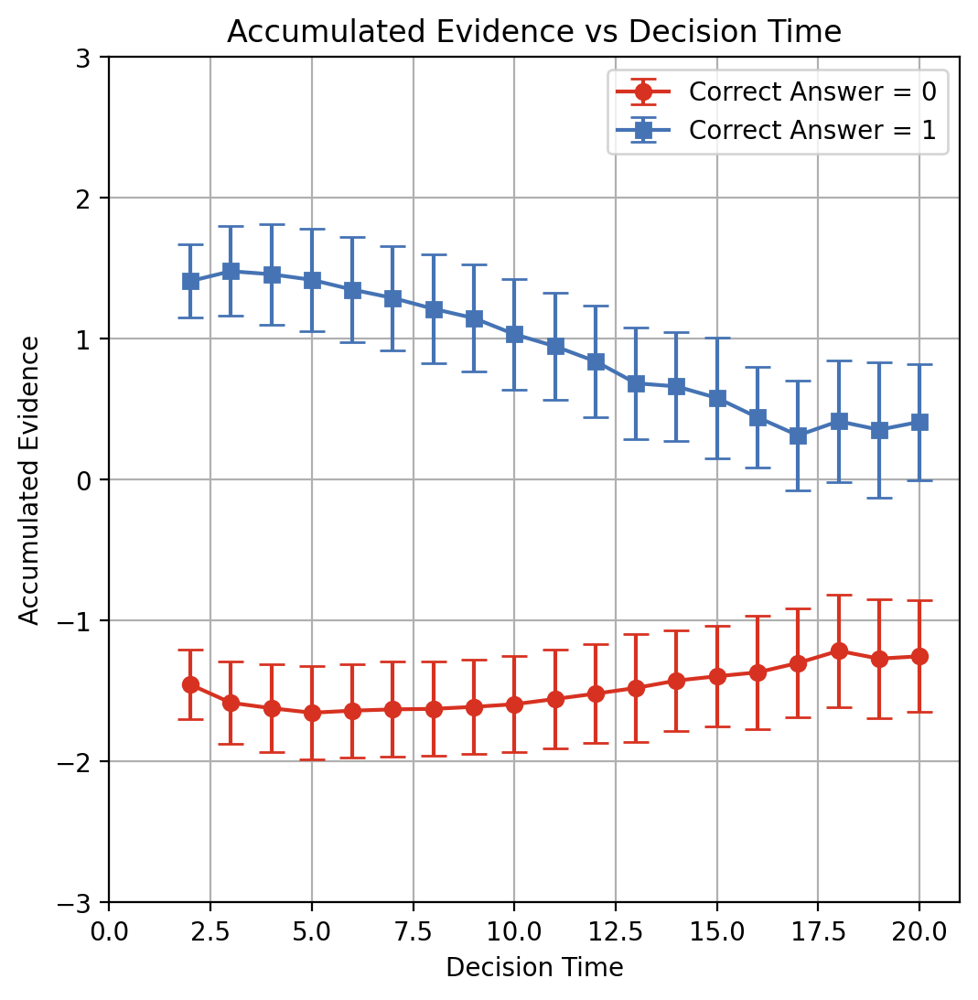

In [7]:
# evidence_map remains unchanged
data = df_decision.copy()
evidence_map = np.linspace(-0.9, 0.9, 8)
# evidence_map = np.array([-0.9, -0.78, -0.66, -0.54, -0.42, -0.3, -0.18, -0.06,
#                          0.06, 0.18, 0.3, 0.42, 0.54, 0.66, 0.78, 0.9])
# evidence_map = np.concatenate([lr_left, lr_right])

data["evidences"] = data.apply(lambda row: [evidence_map[s] for s in row["stimuli_so_far"][:row["decision_time"]]], axis=1)
data["evidence_sum"] = data["evidences"].apply(sum)

# remove trials when agent responded incorrectly and round evidence_sum to 1 decimal place
correct_data = data[data["correct_answer"] == data["action"]].copy()

# separate into groups based on correct_answer value
correct_data_0 = correct_data[correct_data["correct_answer"] == 0]
correct_data_1 = correct_data[correct_data["correct_answer"] == 1]

grouped0_stats = correct_data_0.groupby("decision_time")["evidence_sum"].agg(["mean", "std", "count"])
grouped1_stats = correct_data_1.groupby("decision_time")["evidence_sum"].agg(["mean", "std", "count"])

# Compute standard error (sem) for error bars
grouped0_stats["sem"] = grouped0_stats["std"].fillna(0) / np.sqrt(grouped0_stats["count"])
grouped1_stats["sem"] = grouped1_stats["std"].fillna(0) / np.sqrt(grouped1_stats["count"])

print(grouped0_stats)
print(grouped1_stats)

# remove the decision time where the count is less than 5
grouped0_stats = grouped0_stats[grouped0_stats["count"] >= 10]
grouped1_stats = grouped1_stats[grouped1_stats["count"] >= 10]

# remove the decision time more than 20
grouped0_stats = grouped0_stats[grouped0_stats.index <= 20]
grouped1_stats = grouped1_stats[grouped1_stats.index <= 20]

plt.figure(figsize=(6, 6))
plt.errorbar(grouped0_stats.index, grouped0_stats["mean"], 
             yerr=grouped0_stats["std"], fmt='o-', capsize=5, label="Correct Answer = 0", color='#d73221')
plt.errorbar(grouped1_stats.index, grouped1_stats["mean"], 
             yerr=grouped1_stats["std"], fmt='s-', capsize=5, label="Correct Answer = 1", color='#4573b4')
plt.xlim(0, 21)
plt.ylim(-3, 3)
plt.xlabel("Decision Time")
plt.ylabel("Accumulated Evidence")
plt.title("Accumulated Evidence vs Decision Time")
plt.legend()
plt.grid(True)
plt.show()


In [65]:
grouped0_stats

,mean,std,count,sem
decision_time,,,,
2,-1.354367,0.246312,633,0.009790
3,-1.427099,0.299148,1465,0.007816
4,-1.434478,0.316965,1751,0.007575
5,-1.451838,0.345486,1753,0.008252
6,-1.454204,0.340495,1575,0.008580
7,-1.432738,0.338217,1296,0.009395
8,-1.397525,0.338666,1143,0.010017
9,-1.383693,0.341084,933,0.011167
10,-1.381254,0.354573,759,0.012870


In [66]:
grouped1_stats

,mean,std,count,sem
decision_time,,,,
1,0.900000,0.000000,33,0.000000
2,1.261860,0.254378,1175,0.007421
3,1.318676,0.290839,1845,0.006771
4,1.338082,0.299534,1861,0.006943
5,1.330327,0.297796,1660,0.007309
6,1.329835,0.317988,1492,0.008232
7,1.303479,0.310319,1281,0.008670
8,1.265717,0.301766,1003,0.009528
9,1.252323,0.306086,824,0.010663


wrong trials

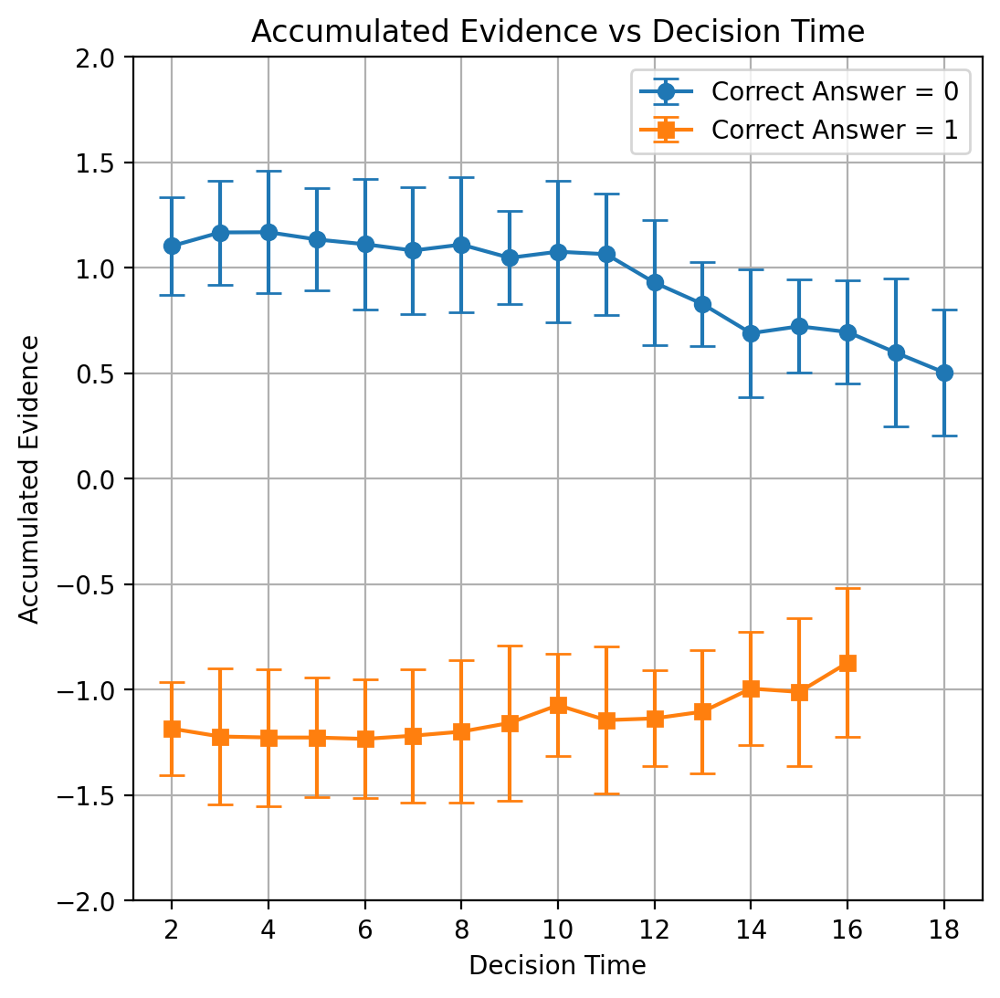

In [67]:
# evidence_map remains unchanged
data = df_decision.copy()
evidence_map = np.linspace(-0.9, 0.9, 8)
# evidence_map = np.concatenate([lr_left, lr_right])

data["evidences"] = data.apply(lambda row: [evidence_map[s] for s in row["stimuli_so_far"][:row["decision_time"]]], axis=1)
data["evidence_sum"] = data["evidences"].apply(sum)

wrong_data = data[data["correct_answer"] != data["action"]].copy()

# separate into groups based on correct_answer value
wrong_data_0 = wrong_data[wrong_data["correct_answer"] == 0]
wrong_data_1 = wrong_data[wrong_data["correct_answer"] == 1]

grouped0_stats = wrong_data_0.groupby("decision_time")["evidence_sum"].agg(["mean", "std", "count"])
grouped1_stats = wrong_data_1.groupby("decision_time")["evidence_sum"].agg(["mean", "std", "count"])

# # Compute standard error (sem) for error bars
# grouped0_stats["sem"] = grouped0_stats["std"].fillna(0) / np.sqrt(grouped0_stats["count"])
# grouped1_stats["sem"] = grouped1_stats["std"].fillna(0) / np.sqrt(grouped1_stats["count"])

# remove the decision time where the count is less than 5
grouped0_stats = grouped0_stats[grouped0_stats["count"] >= 20]
grouped1_stats = grouped1_stats[grouped1_stats["count"] >= 20]

plt.figure(figsize=(6, 6))
plt.errorbar(grouped0_stats.index, grouped0_stats["mean"], 
             yerr=grouped0_stats["std"], fmt='o-', capsize=5, label="Correct Answer = 0")
plt.errorbar(grouped1_stats.index, grouped1_stats["mean"], 
             yerr=grouped1_stats["std"], fmt='s-', capsize=5, label="Correct Answer = 1")
# plt.xlim(0, 20)
plt.ylim(-2, 2)
plt.xlabel("Decision Time")
plt.ylabel("Accumulated Evidence")
plt.title("Accumulated Evidence vs Decision Time")
plt.legend()
plt.grid(True)
plt.show()

### Psychometric Curve

/var/folders/j5/y5g6mhcd7wg0lg4_wsdrql7r0000gn/T/ipykernel_43029/2829269101.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  data_plot = data_plot.groupby("evidence_sum_binned")["action"].mean().reset_index()


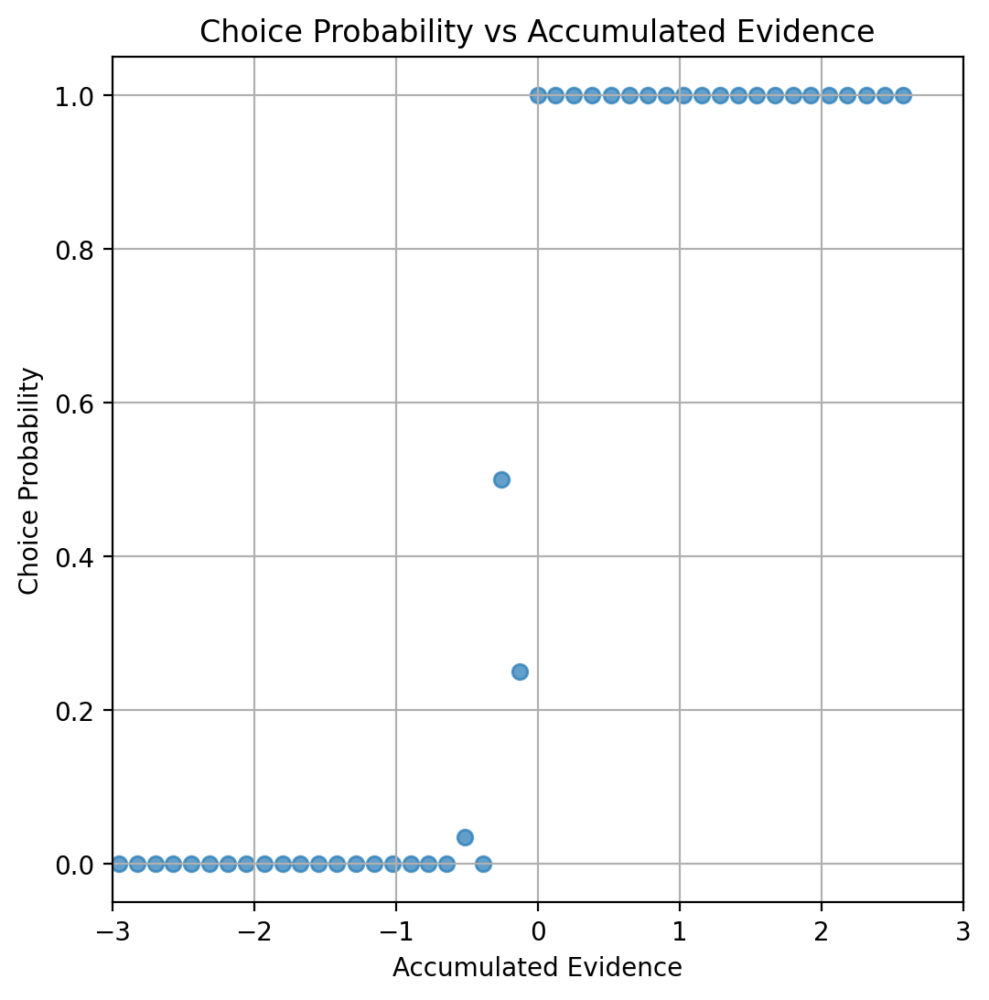

In [68]:
data_plot = data.groupby(['episode']).last().reset_index()

bin_width = 0.01
bin_start = -5
bin_end = 5.1

data_plot["evidence_sum_binned"] = pd.cut(data_plot["evidence_sum"], 
                                         bins=np.arange(bin_start, bin_end, bin_width), 
                                         labels=np.arange(bin_start + bin_width/2, bin_end - bin_width/2, bin_width))

data_plot = data_plot.groupby("evidence_sum_binned")["action"].mean().reset_index()

plt.figure(figsize=(6, 6))
plt.scatter(data_plot["evidence_sum_binned"], data_plot["action"], alpha=0.7)
plt.xlim(-3, 3)
plt.xlabel("Accumulated Evidence")
plt.ylabel("Choice Probability")
plt.title("Choice Probability vs Accumulated Evidence")
plt.grid(True)
plt.show()

### Subject weight of stimulus

In [69]:
import pandas as pd
from collections import Counter

df_last = df.groupby("episode").last()
stimuli_counts = df_last["stimuli_so_far"].apply(Counter)
stimuli_df = pd.DataFrame.from_records(stimuli_counts).fillna(0).astype(int)

# 按照刺激从0-16排序
stimuli_df = stimuli_df[sorted(stimuli_df.columns)]
# 添加action列
stimuli_df["action"] = df_last["action"]

stimuli_df.head()


,0,1,2,3,4,5,6,7,action
0,0,0,0,0,3,2,0,0,1
1,1,0,1,0,0,0,0,0,0
2,1,1,0,3,1,1,0,0,0
3,0,0,0,1,1,0,1,1,1
4,0,0,0,0,1,2,0,0,1


In [70]:
# 构造特征矩阵 X 和目标变量 y
X = stimuli_df.drop(columns=['action'])
y = stimuli_df['action']

# 拟合逻辑回归模型
model = LogisticRegression()
model.fit(X, y)

# 获取逻辑回归模型中的系数和截距
coef_natural = pd.Series(model.coef_[0], index=X.columns)
intercept_natural = model.intercept_[0]

# 转换为以 10 为底的系数
coef_base10 = coef_natural / np.log(10)
intercept_base10 = intercept_natural / np.log(10)

# sort the coefficients by stimulus value
coef_natural = coef_natural.sort_index()
coef_base10 = coef_base10.sort_index()

print("以自然对数拟合的系数：")
print("截距：", intercept_natural)
print(coef_natural)
print("\n转换为以10为底的系数：")
print("截距：", intercept_base10)
print(coef_base10)

以自然对数拟合的系数：
截距： 0.018688929409938503
0   -6.562490
1   -4.789448
2   -2.851816
3   -0.801422
4    0.970770
5    3.132464
6    4.943259
7    6.254270
dtype: float64

转换为以10为底的系数：
截距： 0.008116498915415687
0   -2.850053
1   -2.080031
2   -1.238528
3   -0.348053
4    0.421600
5    1.360412
6    2.146830
7    2.716195
dtype: float64


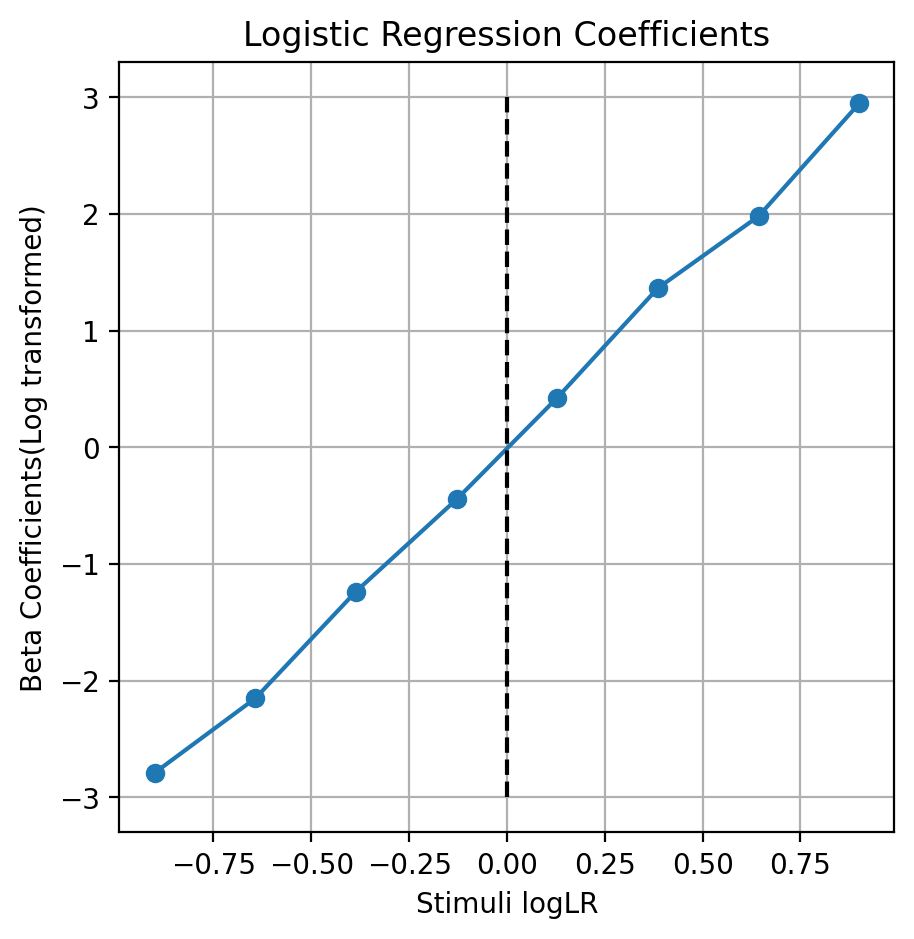

In [12]:
# evidence_map = np.array([-0.965, -0.656, -0.415, -0.226,  0.226,  0.415,  0.656,  0.965])
evidence_map = np.linspace(-0.9, 0.9, 8)
# evidence_map = np.concatenate([lr_left, lr_right])


plt.figure(figsize=(5, 5))
plt.plot(evidence_map, coef_base10, 'o-')
plt.vlines(0, -3, 3, color='black', linestyle='--')
plt.xlabel("Stimuli logLR")
# plt.ylabel("Log Odds (Base 10)")
plt.ylabel("Beta Coefficients(Log transformed)")
plt.title("Logistic Regression Coefficients")
plt.grid(True)
plt.show()

### Policy change

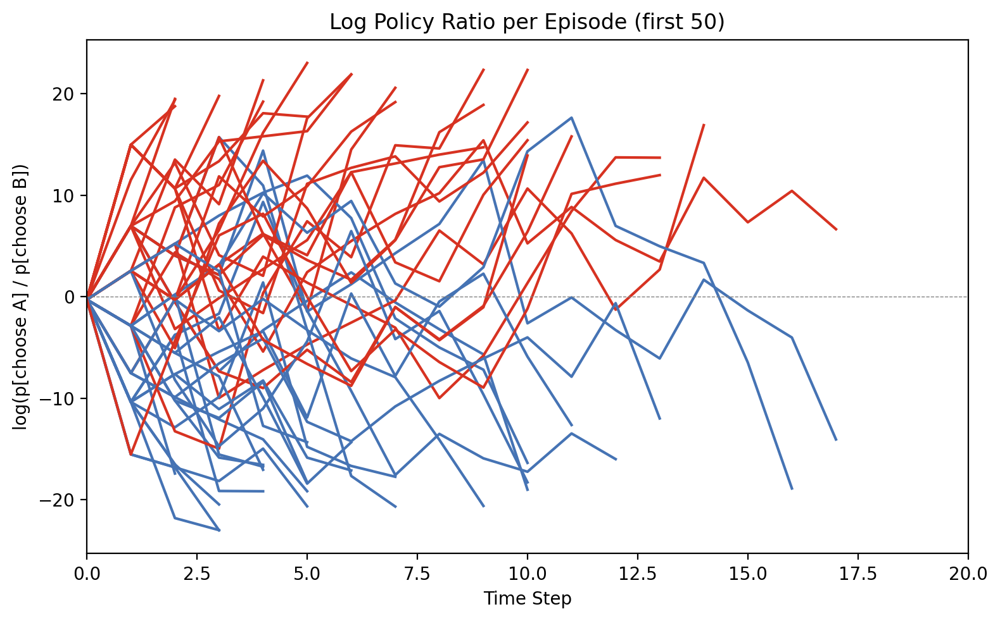

In [33]:
# 提取 policy[1] 和 policy[2]
df['policy_1'] = df['policy'].apply(lambda p: p[0])
df['policy_2'] = df['policy'].apply(lambda p: p[1])

# 计算 log(policy[1]/policy[2])，避免除以 0
df['log_ratio'] = np.log(df['policy_1'] / df['policy_2'].replace(0, np.nan))

plt.figure(figsize=(8, 5))

for ep, group in df.groupby("episode"):
    if ep >= 50:
        break
    log_ratios = group['log_ratio'].values
    x = list(range(0, len(log_ratios)))
    # print(x)
    
    # 添加起点 (0, 0)
    # x = [0] + x
    # y = [0] + list(log_ratios)

    y = list(log_ratios)
    
    # Determine the final choice for this episode
    final_choice = group['action'].iloc[-1]  # Replace 'choice' with your actual column name
    
    if final_choice == 0:
        color = '#d73221'
    else:
        color = '#4573b4'
    
    plt.plot(x, y, color=color, label=f'Episode {ep}')

plt.axhline(0, color='gray', linestyle='--', linewidth=0.5)
plt.xlim(0, 20)
plt.xlabel('Time Step')
plt.ylabel('log(p[choose A] / p[choose B])')
plt.title('Log Policy Ratio per Episode (first 50)')
# plt.legend()
plt.tight_layout()
plt.show()

/Users/lijialin/miniconda3/envs/daily/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


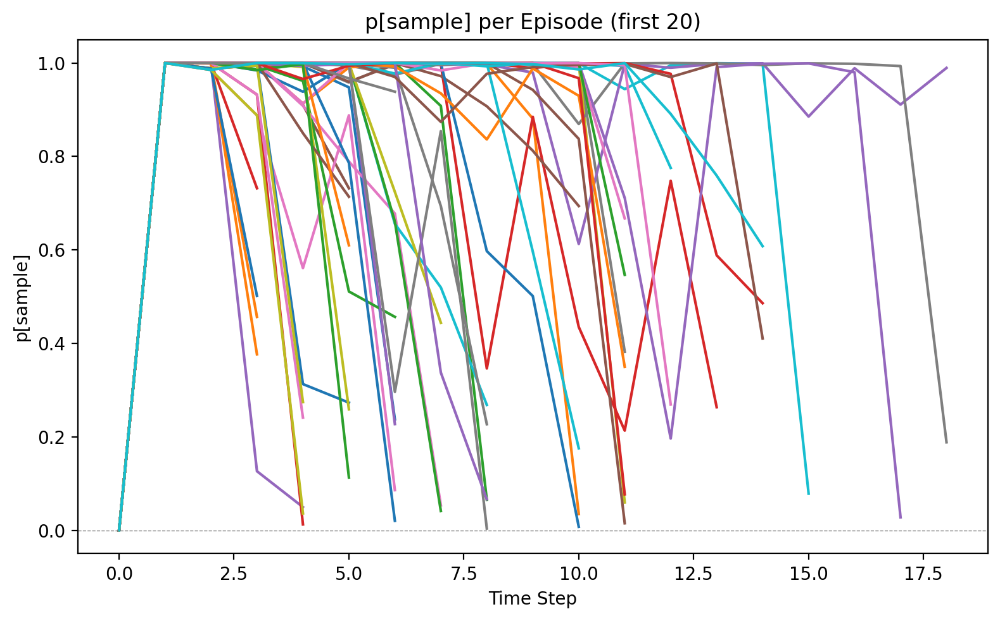

In [56]:
# 提取 policy[1] 和 policy[2]
df['policy_1'] = df['policy'].apply(lambda p: p[0])
df['policy_2'] = df['policy'].apply(lambda p: p[1])
df['p_smaple'] = df['policy'].apply(lambda p: p[2])

# 计算 log(policy[1]/policy[2])，避免除以 0
df['log_ratio'] = np.log(df['policy_1'] / df['policy_2'].replace(0, np.nan))

plt.figure(figsize=(8, 5))

for ep, group in df.groupby("episode"):
    if ep >= 50:
        break
    # log_ratios = group['log_ratio'].values
    p_smaples = group['p_smaple'].values
    x = list(range(1, len(p_smaples) + 1))
    
    # 添加起点 (0, 0)
    x = [0] + x
    y = [0] + list(p_smaples)
    
    plt.plot(x, y, label=f'Episode {ep}')

plt.axhline(0, color='gray', linestyle='--', linewidth=0.5)
plt.xlabel('Time Step')
plt.ylabel('p[sample]')
plt.title('p[sample] per Episode (first 20)')
# plt.legend()
plt.tight_layout()
plt.show()

### Policy threshold

/Users/lijialin/miniconda3/envs/daily/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


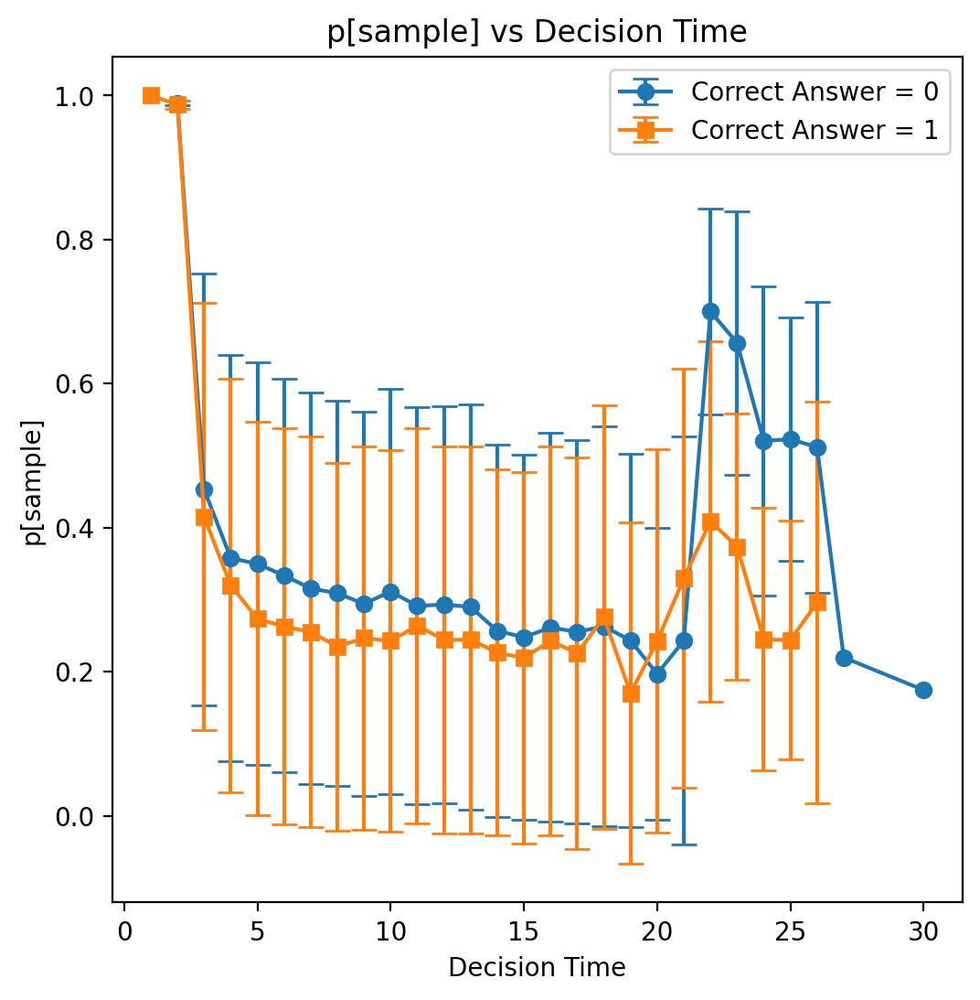

In [71]:
data = df_decision.copy()

# 提取 policy[1] 和 policy[2]
data['policy_1'] = data['policy'].apply(lambda p: p[0])
data['policy_2'] = data['policy'].apply(lambda p: p[1])
data['p_sample'] = data['policy'].apply(lambda p: p[2])

# 计算 log(policy[1]/policy[2])，避免除以 0
data['log_ratio'] = np.log(data['policy_1'] / data['policy_2'].replace(0, np.nan))

# remove trials when agent responded incorrectly and round evidence_sum to 1 decimal place
correct_data = data[data["correct_answer"] == data["action"]].copy()

# separate into groups based on correct_answer value
correct_data_0 = correct_data[correct_data["correct_answer"] == 0]
correct_data_1 = correct_data[correct_data["correct_answer"] == 1]

grouped0_stats = correct_data_0.groupby("decision_time")["p_sample"].agg(["mean", "std", "count"])
grouped1_stats = correct_data_1.groupby("decision_time")["p_sample"].agg(["mean", "std", "count"])

# remove the decision time where the count is less than 5
grouped0_stats = grouped0_stats[grouped0_stats["count"] >= 0]
grouped1_stats = grouped1_stats[grouped1_stats["count"] >= 0]

# plot the mean of log_ratio vs decision_time
plt.figure(figsize=(6, 6))
plt.errorbar(grouped0_stats.index, grouped0_stats["mean"], 
             yerr=grouped0_stats["std"], fmt='o-', capsize=5, label="Correct Answer = 0")
plt.errorbar(grouped1_stats.index, grouped1_stats["mean"], 
             yerr=grouped1_stats["std"], fmt='s-', capsize=5, label="Correct Answer = 1")
plt.xlabel("Decision Time")
plt.ylabel("p[sample]")
plt.title("p[sample] vs Decision Time")
# plt.ylim(-20, 20)
plt.legend()
plt.show()

In [66]:
grouped1_stats

,mean,std,count
decision_time,,,
3,-inf,NaN,826
4,-inf,NaN,1793
5,-inf,NaN,2007
6,-inf,NaN,1805
7,-inf,NaN,1576
8,-inf,NaN,1334
9,-inf,NaN,1012
10,-inf,NaN,865
11,-inf,NaN,658


In [14]:
data

,episode,correct_answer,stimuli_so_far,current_stimulus,action,reward,policy,hidden_state,decision_time,policy_1,policy_2,log_ratio
5,0,1,"[5, 4, 4, 4, 5]",5,1,10.0,"[3.7e-09, 0.7627325654, 0.23726746440000002]","[0.5196812749, -0.23417007920000002, -0.790941...",6,3.700000e-09,7.627326e-01,-19.144085
8,1,0,"[2, 0]",0,0,10.0,"[0.5435290933, 1.9e-09, 0.4564709663]","[-0.0098931585, -0.3579614162, 0.8383913040000...",3,5.435291e-01,1.900000e-09,19.471740
16,2,0,"[3, 4, 3, 3, 5, 0, 1]",1,0,10.0,"[0.9346830845, 1.1000000000000001e-09, 0.06531...","[-0.0678588152, -0.5891023874, 0.7927939892, 0...",8,9.346831e-01,1.100000e-09,20.560408
19,3,1,"[4, 7]",7,1,10.0,"[7.4e-09, 0.2680760324, 0.7319239378]","[0.6644068360000001, -0.24841944870000002, -0....",3,7.400000e-09,2.680760e-01,-17.405301
23,4,1,"[6, 7, 5]",5,1,10.0,"[1e-10, 0.9504228830000001, 0.0495770909]","[0.5309756398000001, -0.2522401512, -0.9786083...",4,1.000000e-10,9.504229e-01,-22.975003
...,...,...,...,...,...,...,...,...,...,...,...,...
241576,29995,1,"[4, 7, 6]",6,1,10.0,"[2e-10, 0.9620417953, 0.0379582085]","[0.4923859239, -0.24779808520000002, -0.948909...",4,2.000000e-10,9.620418e-01,-22.294006
241581,29996,0,"[2, 0, 3, 3]",3,0,10.0,"[0.5993204713, 6.9000000000000006e-09, 0.40067...","[0.2618918717, -0.5779919624000001, 0.54582279...",5,5.993205e-01,6.900000e-09,18.279786
241586,29997,0,"[2, 3, 3, 0]",0,0,10.0,"[0.9322431087, 3e-10, 0.0677568316]","[-7.17789e-05, -0.46111434700000004, 0.8472669...",5,9.322431e-01,3.000000e-10,21.857077
241590,29998,1,"[5, 5, 6]",6,1,10.0,"[7.000000000000001e-10, 0.8701041341, 0.129895...","[0.487653017, -0.24255235490000002, -0.8885897...",4,7.000000e-10,8.701041e-01,-20.940798


In [15]:
np.min(data['log_ratio'])

np.float64(-inf)

/Users/lijialin/miniconda3/envs/daily/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


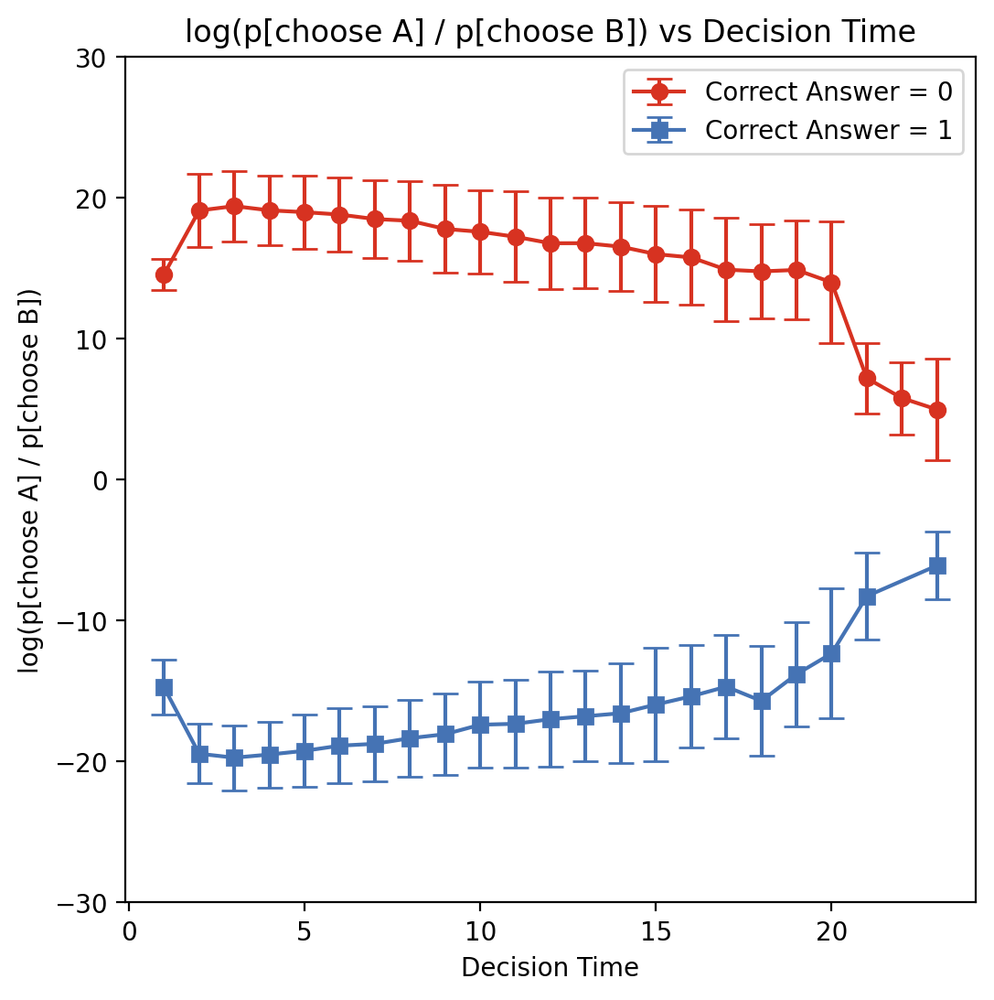

In [35]:
data = df_decision.copy()

# 提取 policy[1] 和 policy[2]
data['policy_1'] = data['policy'].apply(lambda p: p[0])
data['policy_2'] = data['policy'].apply(lambda p: p[1])

# 计算 log(policy[1]/policy[2])，避免除以 0
data['log_ratio'] = np.log(data['policy_1'] / data['policy_2'].replace(0, np.nan))
data = data[np.isfinite(data['log_ratio'])]

# remove trials when agent responded incorrectly and round evidence_sum to 1 decimal place
correct_data = data[data["correct_answer"] == data["action"]].copy()

# separate into groups based on correct_answer value
correct_data_0 = correct_data[correct_data["correct_answer"] == 0]
correct_data_1 = correct_data[correct_data["correct_answer"] == 1]

grouped0_stats = correct_data_0.groupby("decision_time")["log_ratio"].agg(["mean", "std", "count"])
grouped1_stats = correct_data_1.groupby("decision_time")["log_ratio"].agg(["mean", "std", "count"])

# remove the decision time where the count is less than 5
grouped0_stats = grouped0_stats[grouped0_stats["count"] >= 10]
grouped1_stats = grouped1_stats[grouped1_stats["count"] >= 10]

# plot the mean of log_ratio vs decision_time
plt.figure(figsize=(6, 6))
plt.errorbar(grouped0_stats.index, grouped0_stats["mean"], 
             yerr=grouped0_stats["std"], fmt='o-', capsize=5, label="Correct Answer = 0", color='#d73221')
plt.errorbar(grouped1_stats.index, grouped1_stats["mean"], 
             yerr=grouped1_stats["std"], fmt='s-', capsize=5, label="Correct Answer = 1", color='#4573b4')
plt.xlabel("Decision Time")
plt.ylabel("log(p[choose A] / p[choose B])")
plt.title("log(p[choose A] / p[choose B]) vs Decision Time")
plt.ylim(-30, 30)
plt.legend()
plt.show()

In [78]:
df

,episode,correct_answer,stimuli_so_far,current_stimulus,action,reward,policy,hidden_state,decision_time,policy_1,policy_2,log_ratio,p_smaple,p_sample,evidences,evidence_sum
0,0,1,[],-1,2,-0.05,"[2.97438e-05, 3.96241e-05, 0.9999306202]","[0.48027428980000003, -0.2562673092, 0.3711019...",6,2.974380e-05,3.962410e-05,-0.286817,0.999931,0.999931,[],0.000000
1,0,1,[5],5,2,-0.06,"[1.7e-08, 3.13539e-05, 0.9999686480000001]","[0.6129333377, -0.2464112937, -0.5344952941000...",6,1.700000e-08,3.135390e-05,-7.519881,0.999969,0.999969,[0.3857142857142858],0.385714
2,0,1,"[5, 4]",4,2,-0.07,"[4.1800000000000004e-08, 0.0008245662000000001...","[0.4195391536, -0.2442313731, -0.4529969394, 0...",6,4.180000e-08,8.245662e-04,-9.889716,0.999175,0.999175,"[0.3857142857142858, 0.12857142857142867]",0.514286
3,0,1,"[5, 4, 4]",4,2,-0.08,"[4.13e-08, 0.0072386418, 0.9927613735]","[0.4163249731, -0.2411135137, -0.5588402152, 0...",6,4.130000e-08,7.238642e-03,-12.074082,0.992761,0.992761,"[0.3857142857142858, 0.12857142857142867, 0.12...",0.642857
4,0,1,"[5, 4, 4, 4]",4,2,-0.09,"[4.16e-08, 0.0521478653, 0.9478521347000001]","[0.4147548676, -0.23804342750000002, -0.664783...",6,4.160000e-08,5.214787e-02,-14.041494,0.947852,0.947852,"[0.3857142857142858, 0.12857142857142867, 0.12...",0.771429
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
241594,29999,0,"[4, 3, 2]",2,2,-0.08,"[0.0003052476, 1.906e-07, 0.9996945858]","[0.0853013098, -0.2670257688, 0.5765174627, -0...",8,3.052476e-04,1.906000e-07,7.378702,0.999695,0.999695,"[0.12857142857142867, -0.12857142857142845, -0...",-0.385714
241595,29999,0,"[4, 3, 2, 3]",3,2,-0.09,"[0.0039450275, 2.482e-07, 0.9960547686000001]","[0.27062702180000003, -0.28219693900000004, 0....",8,3.945027e-03,2.482000e-07,9.673732,0.996055,0.996055,"[0.12857142857142867, -0.12857142857142845, -0...",-0.514286
241596,29999,0,"[4, 3, 2, 3, 2]",2,2,-0.10,"[0.1616874933, 4.0300000000000004e-08, 0.83831...","[0.08934397250000001, -0.3377423882, 0.6521794...",8,1.616875e-01,4.030000e-08,15.204825,0.838312,0.838312,"[0.12857142857142867, -0.12857142857142845, -0...",-0.900000
241597,29999,0,"[4, 3, 2, 3, 2, 3]",3,2,-0.11,"[0.2848117352, 5.5e-08, 0.7151881456]","[0.2419647276, -0.4093284607, 0.5188024044, -0...",8,2.848117e-01,5.500000e-08,15.460006,0.715188,0.715188,"[0.12857142857142867, -0.12857142857142845, -0...",-1.028571


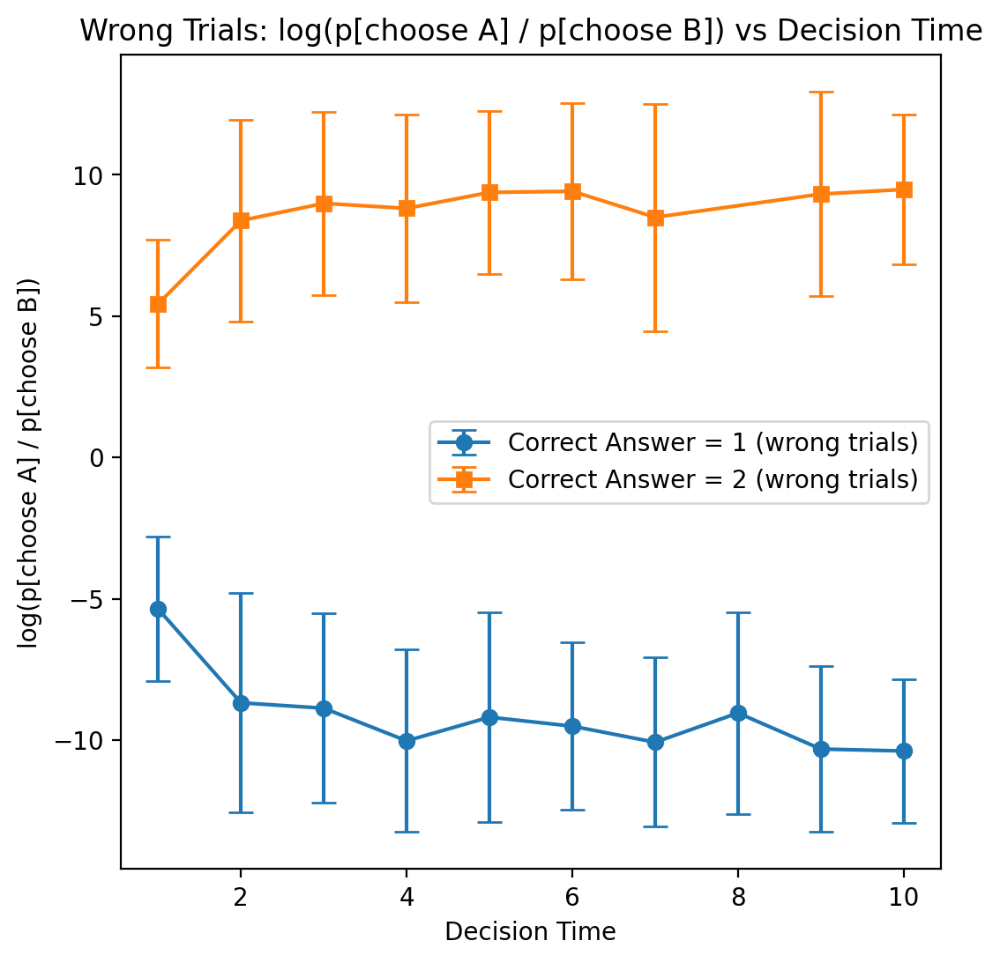

In [17]:
data = df_decision.copy()

# 提取 policy[1] 和 policy[2]
data['policy_1'] = data['policy'].apply(lambda p: p[1])
data['policy_2'] = data['policy'].apply(lambda p: p[2])

# 计算 log(policy[1]/policy[2])，避免除以 0
data['log_ratio'] = np.log(data['policy_1'] / data['policy_2'].replace(0, np.nan))

# ✅ 筛选错误的 trial（action ≠ correct_answer）
wrong_data = data[data["correct_answer"] != data["action"]].copy()

# 分别对 ground truth 为 1 或 2 的错误反应进行分组
wrong_data_0 = wrong_data[wrong_data["correct_answer"] == 1]
wrong_data_1 = wrong_data[wrong_data["correct_answer"] == 2]

# 按决策时间分组统计 log_ratio
grouped0_stats = wrong_data_0.groupby("decision_time")["log_ratio"].agg(["mean", "std", "count"])
grouped1_stats = wrong_data_1.groupby("decision_time")["log_ratio"].agg(["mean", "std", "count"])

# 移除样本数太少的时间点（小于 20）
grouped0_stats = grouped0_stats[grouped0_stats["count"] >= 20]
grouped1_stats = grouped1_stats[grouped1_stats["count"] >= 20]

# ✅ 画图
plt.figure(figsize=(6, 6))
plt.errorbar(grouped0_stats.index, grouped0_stats["mean"], 
             yerr=grouped0_stats["std"], fmt='o-', capsize=5, label="Correct Answer = 1 (wrong trials)")
plt.errorbar(grouped1_stats.index, grouped1_stats["mean"], 
             yerr=grouped1_stats["std"], fmt='s-', capsize=5, label="Correct Answer = 2 (wrong trials)")
plt.xlabel("Decision Time")
plt.ylabel("log(p[choose A] / p[choose B])")
plt.title("Wrong Trials: log(p[choose A] / p[choose B]) vs Decision Time")
plt.legend()
plt.show()

### Sampling Probability

70
5238
14272
19915
22146
22771
21848
19620
19440
17094
14148
12831
11270
9390
7216
6069
4842
3724
2700
2394


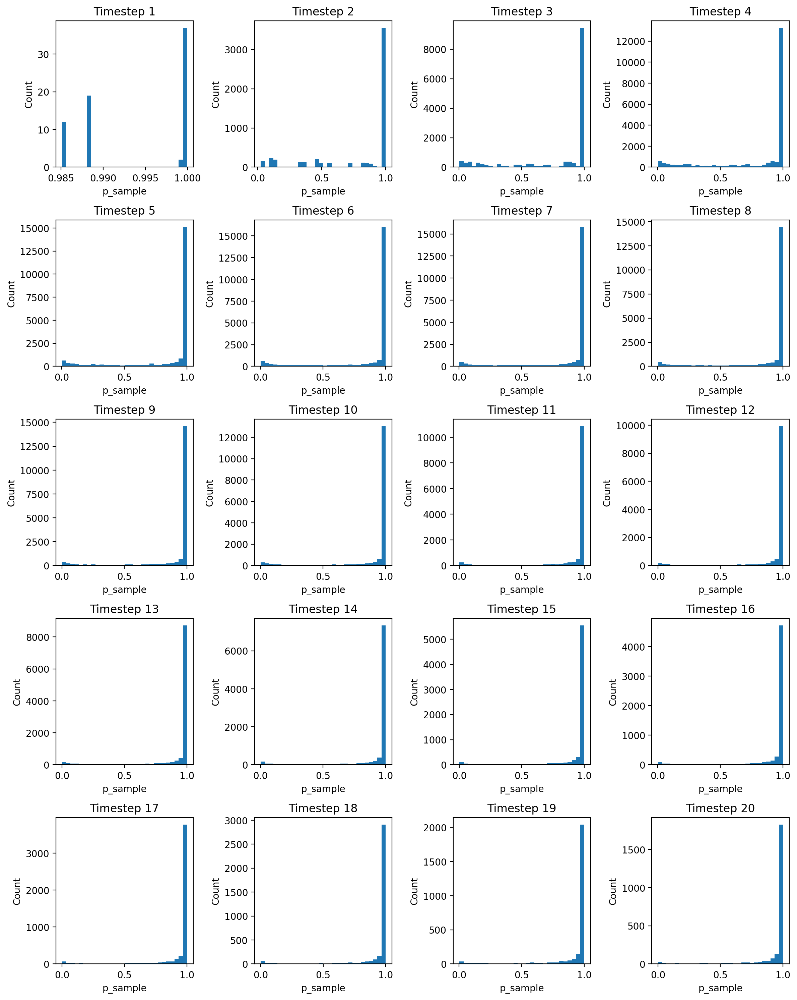

In [37]:
# Get sampling probabilities from policy
df['p_sample'] = df['policy'].apply(lambda p: p[2])

# Create subplots for different timesteps
# max_timestep = df['decision_time'].max()
max_timestep = 20
n_rows = int(np.ceil(max_timestep/4))
fig, axes = plt.subplots(n_rows, 4, figsize=(12, 3*n_rows))
axes = axes.flatten()

# Plot histogram for each timestep
for t in range(max_timestep):
    if t < len(axes):
        # Get data for this timestep
        mask = df['decision_time'] == t+1
        p_sample = df[mask]['p_sample']

        print(len(p_sample))
        
        # Plot histogram
        axes[t].hist(p_sample, bins=30, density=False)
        axes[t].set_title(f'Timestep {t+1}')
        axes[t].set_xlabel('p_sample')
        axes[t].set_ylabel('Count')

# Remove empty subplots
for i in range(max_timestep, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()


In [25]:
df.head()

,episode,correct_answer,stimuli_so_far,current_stimulus,action,reward,policy,hidden_state,decision_time,policy_1,policy_2,log_ratio,p_smaple,p_sample
0,0,1,[9],9,0,0,"[0.9871844649, 0.0114417961, 0.001373709800000...","[0.181900993, 0.41962099080000004, 0.090306356...",4,0.011442,0.001374,2.119758,0.987184,0.987184
1,0,1,"[9, 9]",9,0,0,"[0.9656103849000001, 0.0341919884, 0.0001976165]","[0.1791154593, 0.4476056695, 0.203549936400000...",4,0.034192,0.000198,5.153418,0.965610,0.965610
2,0,1,"[9, 9, 8]",8,0,0,"[0.9434815049, 0.0564362854, 8.21881e-05]","[0.0744589046, 0.43054926400000004, 0.23447613...",4,0.056436,0.000082,6.531857,0.943482,0.943482
3,0,1,"[9, 9, 8, 10]",10,1,1,"[0.7965764403000001, 0.20340602100000002, 1.74...","[-0.0300476402, 0.4241915941, 0.3363825977, 0....",4,0.203406,0.000017,9.364474,0.796576,0.796576
4,1,1,[7],7,0,0,"[0.9922543764, 0.0026517508000000003, 0.005093...","[0.24682842200000002, 0.4294991195, -0.0583833...",11,0.002652,0.005094,-0.652811,0.992254,0.992254


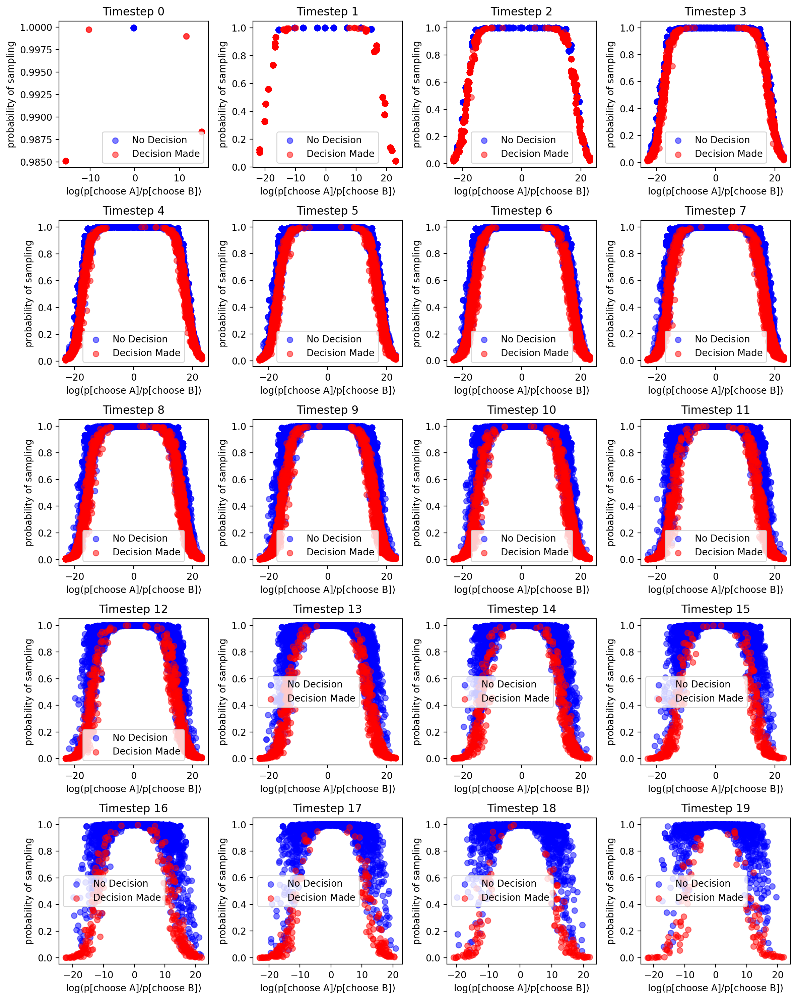

In [38]:
max_timestep = 20
n_rows = int(np.ceil(max_timestep/4))
fig, axes = plt.subplots(n_rows, 4, figsize=(12, 3*n_rows))
axes = axes.flatten()

# Plot scatter for each timestep
for t in range(max_timestep):
    if t < len(axes):
        # Get data for this timestep
        mask = df['decision_time'] == t+1
        timestep_data = df[mask]
        
        # Create decision mask
        decision_mask = timestep_data['action'] < 2
        
        # Plot scatter points
        axes[t].scatter(timestep_data[~decision_mask]['log_ratio'], 
                       timestep_data[~decision_mask]['p_sample'],
                       c='blue', alpha=0.5, label='No Decision')
        axes[t].scatter(timestep_data[decision_mask]['log_ratio'],
                       timestep_data[decision_mask]['p_sample'], 
                       c='red', alpha=0.5, label='Decision Made')
        
        axes[t].set_title(f'Timestep {t}')
        axes[t].set_xlabel('log(p[choose A]/p[choose B])')
        axes[t].set_ylabel('probability of sampling')
        axes[t].legend()

# Remove empty subplots
for i in range(max_timestep, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()



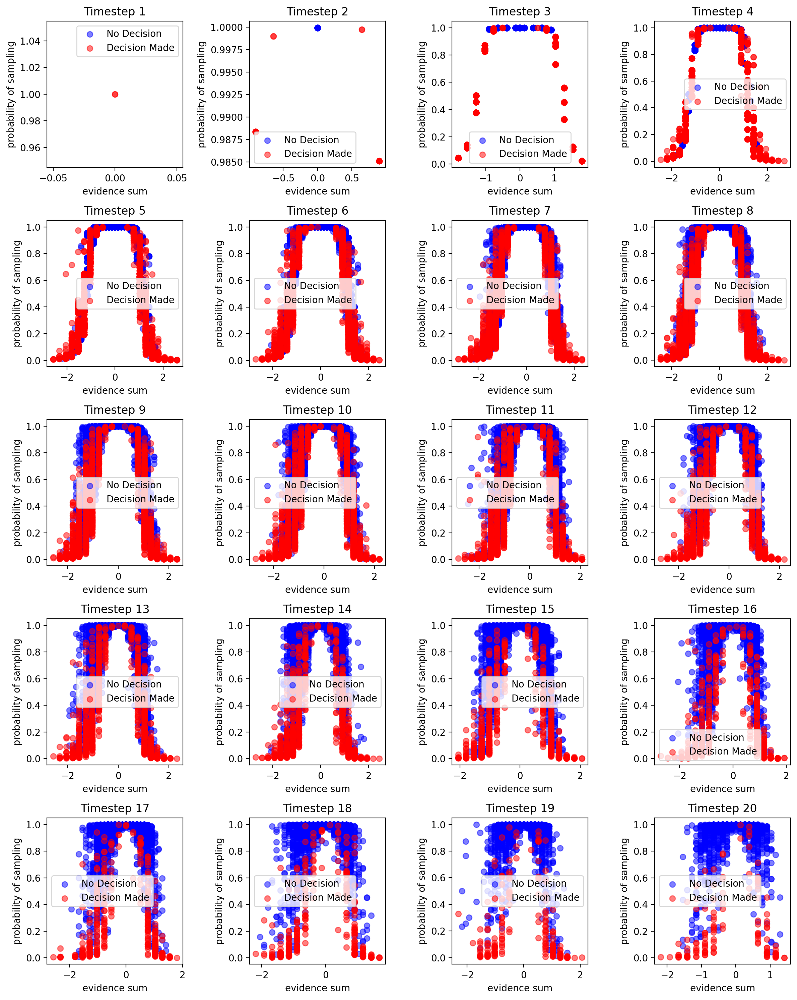

In [77]:
max_timestep = 20
n_rows = int(np.ceil(max_timestep/4))
fig, axes = plt.subplots(n_rows, 4, figsize=(12, 3*n_rows))
axes = axes.flatten()

df["evidences"] = df.apply(lambda row: [evidence_map[s] for s in row["stimuli_so_far"][:row["decision_time"]]], axis=1)
df["evidence_sum"] = df["evidences"].apply(sum)

# Plot scatter for each timestep
for t in range(max_timestep):
    if t < len(axes):
        # Get data for this timestep
        mask = df['decision_time'] == t+1
        timestep_data = df[mask]
        
        # Create decision mask
        decision_mask = timestep_data['action'] < 2
        
        # Plot scatter points
        axes[t].scatter(timestep_data[~decision_mask]['evidence_sum'], 
                       timestep_data[~decision_mask]['p_sample'],
                       c='blue', alpha=0.5, label='No Decision')
        axes[t].scatter(timestep_data[decision_mask]['evidence_sum'],
                       timestep_data[decision_mask]['p_sample'], 
                       c='red', alpha=0.5, label='Decision Made')
        
        axes[t].set_title(f'Timestep {t+1}')
        axes[t].set_xlabel('evidence sum')
        axes[t].set_ylabel('probability of sampling')
        axes[t].legend()

# Remove empty subplots
for i in range(max_timestep, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()



In [28]:
# Count episodes with decisions after 20 timesteps
long_decisions = df[df['decision_time'] > 20]['episode'].nunique()
print(f"Number of episodes with decisions after 20 timesteps: {long_decisions}")


Number of episodes with decisions after 20 timesteps: 106


### Evidence Overflow

                   mean       std  count       sem
decision_time                                     
1              0.380724  0.294677    663  0.011444
2              0.525389  0.352571    772  0.012689
3              0.594329  0.421223    656  0.016446
4              0.598552  0.458832    580  0.019052
5              0.645831  0.468010    415  0.022974
6              0.660632  0.543194    285  0.032176
7              0.619266  0.471272    218  0.031919
8              0.569379  0.521877    145  0.043340
9              0.658667  0.506087     90  0.053346
10             0.598462  0.471546     78  0.053392
11             0.443529  0.506860     51  0.070975
12             0.470769  0.436489     39  0.069894
13             0.545217  0.486068     23  0.101352
14             0.738947  0.402518     19  0.092344
15             0.390000  0.406537     12  0.117357
16             0.462857  0.335346      7  0.126749
17             0.444000  0.444162      5  0.198635
18             0.270000  0.3446

/var/folders/j5/y5g6mhcd7wg0lg4_wsdrql7r0000gn/T/ipykernel_12274/3188531536.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  second_last["evidences"] = second_last.apply(lambda row: [evidence_map[s] for s in row["stimuli_so_far"][:row["decision_time"]]], axis=1)
/var/folders/j5/y5g6mhcd7wg0lg4_wsdrql7r0000gn/T/ipykernel_12274/3188531536.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  second_last["evidence_sum"] = second_last["evidences"].apply(sum)


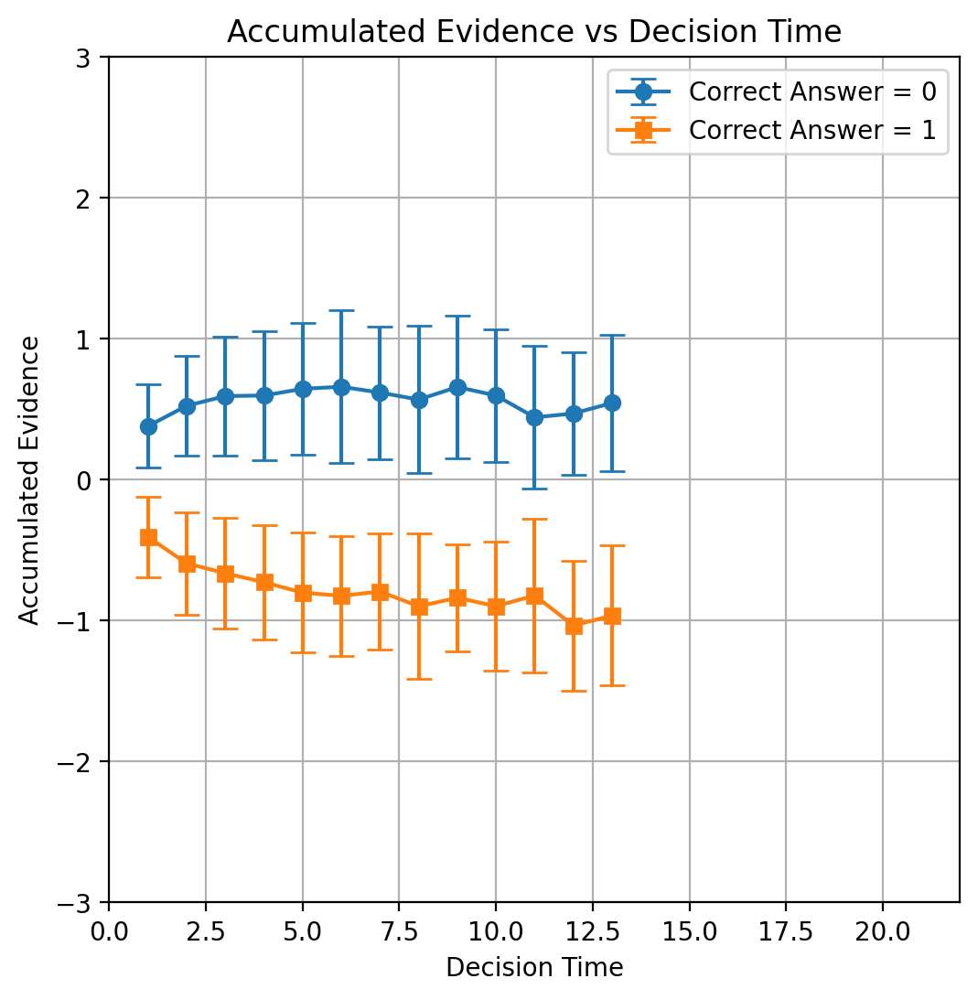

In [108]:

df = pd.read_json(path + 'data.json', lines=True)

df['decision_time'] = df['stimuli_so_far'].apply(len)

# add a column to indicate if the trial is correct
# if the last row is correct, then the trial is correct
# Step 1: 获取每个 episode 最后一行
last_rows = df.groupby('episode').last().reset_index()

# Step 2: 计算 correctness
last_rows['correct'] = last_rows['correct_answer'] == last_rows['action']

# Step 3: 合并回原始 df（只给最后一行打标签）
df = df.merge(last_rows[['episode', 'correct']], on='episode', how='left')

# # remove trials when agent responded incorrectly
df = df[df['correct'] == True]

# ——— 2. 只保留至少两步的 episode ———
episode_counts = df.groupby('episode').size()
valid_episodes = episode_counts[episode_counts >= 2].index
df2 = df[df['episode'].isin(valid_episodes)]

# ——— 3. 提取倒数第二行 ———
# 先按 episode 和 decision_time 排序
df2 = df2.sort_values(['episode','decision_time'])
# 然后 groupby.nth(-2) 自动跳过不足 2 行的组
second_last = (
    df2
    .groupby('episode', as_index=False)
    .nth(-2)            # 就是倒数第二
)

evidence_map = np.linspace(-0.9, 0.9, 16)

second_last["evidences"] = second_last.apply(lambda row: [evidence_map[s] for s in row["stimuli_so_far"][:row["decision_time"]]], axis=1)
second_last["evidence_sum"] = second_last["evidences"].apply(sum)

# separate into groups based on correct_answer value
correct_data_0 = second_last[second_last["correct_answer"] == 1]
correct_data_1 = second_last[second_last["correct_answer"] == 2]

grouped0_stats = correct_data_0.groupby("decision_time")["evidence_sum"].agg(["mean", "std", "count"])
grouped1_stats = correct_data_1.groupby("decision_time")["evidence_sum"].agg(["mean", "std", "count"])

# Compute standard error (sem) for error bars
grouped0_stats["sem"] = grouped0_stats["std"].fillna(0) / np.sqrt(grouped0_stats["count"])
grouped1_stats["sem"] = grouped1_stats["std"].fillna(0) / np.sqrt(grouped1_stats["count"])

print(grouped0_stats)
print(grouped1_stats)

# remove the decision time where the count is less than 5
grouped0_stats = grouped0_stats[grouped0_stats["count"] >= 20]
grouped1_stats = grouped1_stats[grouped1_stats["count"] >= 20]

plt.figure(figsize=(6, 6))
plt.errorbar(grouped0_stats.index, grouped0_stats["mean"], 
             yerr=grouped0_stats["std"], fmt='o-', capsize=5, label="Correct Answer = 0")
plt.errorbar(grouped1_stats.index, grouped1_stats["mean"], 
             yerr=grouped1_stats["std"], fmt='s-', capsize=5, label="Correct Answer = 1")
plt.xlim(0, 22)
plt.ylim(-3, 3)
plt.xlabel("Decision Time")
plt.ylabel("Accumulated Evidence")
plt.title("Accumulated Evidence vs Decision Time")
plt.legend()
plt.grid(True)
plt.show()


plt.show()

/var/folders/j5/y5g6mhcd7wg0lg4_wsdrql7r0000gn/T/ipykernel_12274/4087975014.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  second_last['logLR'] = np.log(
/var/folders/j5/y5g6mhcd7wg0lg4_wsdrql7r0000gn/T/ipykernel_12274/4087975014.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  second_last['t_minus1'] = second_last['decision_time'] - 1


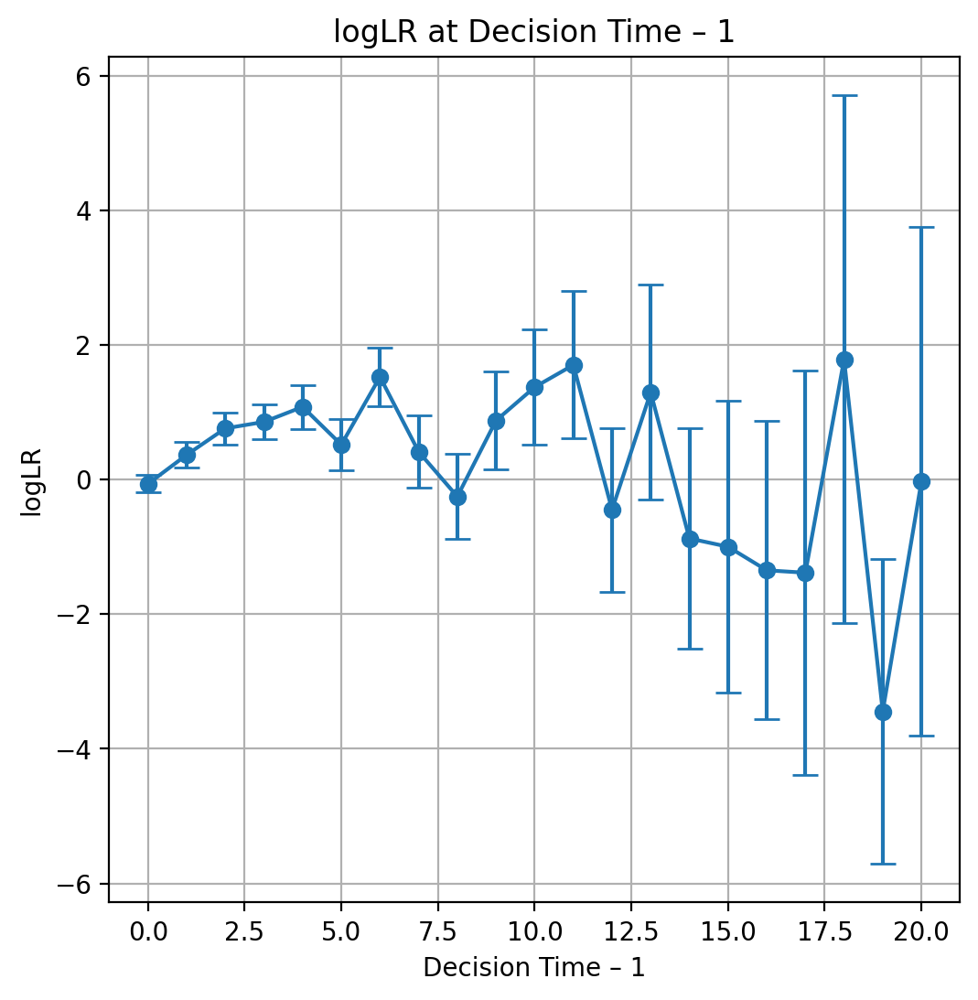

In [109]:
# ——— 4. 计算 logLR ———
# 假设 policy 列是一个长度-3 的 list/array：[p0,p1,p2]
second_last['logLR'] = np.log(
    second_last['policy'].apply(lambda p: p[1]) /
    second_last['policy'].apply(lambda p: p[2])
)

# 同时记录 “decision_time - 1” 这个时间点
second_last['t_minus1'] = second_last['decision_time'] - 1

# ——— 5. 按 t_minus1 聚合并画图 ———
stats = (
    second_last
    .groupby('t_minus1')['logLR']
    .agg(['mean','std','count'])
    .assign(sem=lambda d: d['std'] / np.sqrt(d['count']))
)

plt.figure(figsize=(6,6))
plt.errorbar(
    stats.index, stats['mean'],
    yerr=stats['sem'],
    fmt='o-', capsize=5
)
plt.xlabel("Decision Time – 1")
plt.ylabel("logLR")
plt.title("logLR at Decision Time – 1")
plt.grid(True)
plt.show()

### Accumulated evidence

In [110]:
df

,episode,correct_answer,stimuli_so_far,current_stimulus,action,reward,policy,hidden_state,decision_time,correct
0,0,1,[9],9,0,0,"[0.9797613621000001, 0.0182781667, 0.0019604263]","[-0.32808977370000003, 0.2177065313, 0.2986678...",1,True
1,0,1,"[9, 9]",9,0,0,"[0.9161131382000001, 0.0836374909, 0.0002493395]","[-0.6526339054, 0.29288637640000004, 0.3837382...",2,True
2,0,1,"[9, 9, 8]",8,0,0,"[0.8392363787, 0.1606883556, 7.52865e-05]","[-0.7740752101, 0.2941228151, 0.2969554961, 0....",3,True
3,0,1,"[9, 9, 8, 10]",10,0,0,"[0.586453855, 0.4135388136, 7.330600000000001e...","[-0.8366996050000001, 0.2713499665, 0.51576673...",4,True
4,0,1,"[9, 9, 8, 10, 8]",8,0,0,"[0.5139071345, 0.48608756070000003, 5.24730000...","[-0.9309413433, 0.2637503445, 0.32147511840000...",5,True
...,...,...,...,...,...,...,...,...,...,...
47710,9998,2,"[8, 5, 4]",4,0,0,"[0.7407860756, 0.0001120775, 0.25910192730000003]","[-0.03367199, 0.6159366369, 0.1670971513, -0.6...",3,True
47711,9998,2,"[8, 5, 4, 6]",6,0,0,"[0.5397906303000001, 2.22836e-05, 0.4601870775...","[0.1075518131, 0.7679451704, 0.2168117017, -0....",4,True
47712,9998,2,"[8, 5, 4, 6, 5]",5,2,1,"[0.3990804255, 5.084300000000001e-06, 0.600914...","[0.1907256842, 0.7898437977, 0.2954573035, -0....",5,True
47713,9999,1,[13],13,0,0,"[0.7291316986, 0.2704508603, 0.000417348400000...","[-0.364030242, -0.1182565391, 0.35843339560000...",1,True


In [41]:
df_filtered[df_filtered['episode'] == 0]

,episode,correct_answer,stimuli_so_far,current_stimulus,action,reward,policy,hidden_state,decision_time,policy_1,policy_2,log_ratio,p_sample,time_step,logLR
0,0,1,[],-1,2,-0.05,"[2.97438e-05, 3.96241e-05, 0.9999306202]","[0.48027428980000003, -0.2562673092, 0.3711019...",5,2.974380e-05,0.000040,-0.286817,0.999931,0,0.000000
1,0,1,[5],5,2,-0.06,"[1.7e-08, 3.13539e-05, 0.9999686480000001]","[0.6129333377, -0.2464112937, -0.5344952941000...",5,1.700000e-08,0.000031,-7.519881,0.999969,1,0.385714
2,0,1,"[5, 4]",4,2,-0.07,"[4.1800000000000004e-08, 0.0008245662000000001...","[0.4195391536, -0.2442313731, -0.4529969394, 0...",5,4.180000e-08,0.000825,-9.889716,0.999175,2,0.514286
3,0,1,"[5, 4, 4]",4,2,-0.08,"[4.13e-08, 0.0072386418, 0.9927613735]","[0.4163249731, -0.2411135137, -0.5588402152, 0...",5,4.130000e-08,0.007239,-12.074082,0.992761,3,0.642857
4,0,1,"[5, 4, 4, 4]",4,2,-0.09,"[4.16e-08, 0.0521478653, 0.9478521347000001]","[0.4147548676, -0.23804342750000002, -0.664783...",5,4.160000e-08,0.052148,-14.041494,0.947852,4,0.771429
5,0,1,"[5, 4, 4, 4, 5]",5,1,10.00,"[3.7e-09, 0.7627325654, 0.23726746440000002]","[0.5196812749, -0.23417007920000002, -0.790941...",5,3.700000e-09,0.762733,-19.144085,0.237267,5,1.157143


/Users/lijialin/miniconda3/envs/daily/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


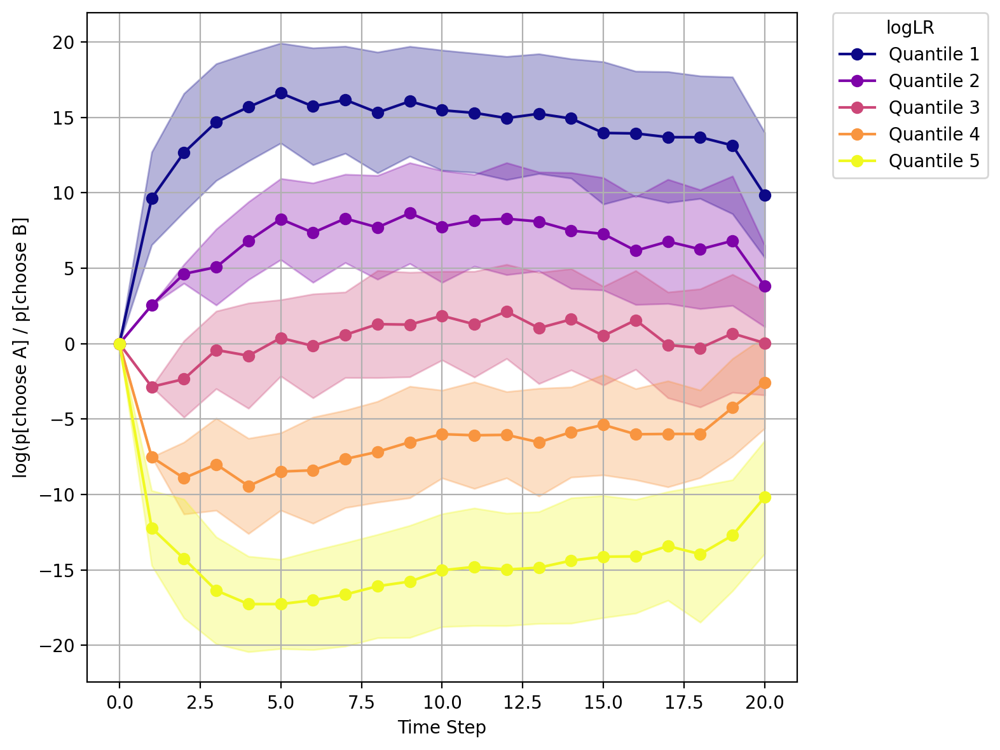

In [44]:
df['policy_1'] = df['policy'].apply(lambda p: p[0])
df['policy_2'] = df['policy'].apply(lambda p: p[1])

# 计算 log(policy[1]/policy[2])，避免除以 0
df['log_ratio'] = np.log(df['policy_1'] / df['policy_2'].replace(0, np.nan))
df = df[np.isfinite(df['log_ratio'])]

evidence_map = np.linspace(-0.9, 0.9, 8)

df_filtered = df[df['stimuli_so_far'].apply(len) <= df['decision_time']]

# 创建时间步列（相对于 trial 开始）
df_filtered = df_filtered.copy()
df_filtered['time_step'] = df_filtered['stimuli_so_far'].apply(len)

# 计算每个时间步的 logLR
df_filtered['logLR'] = df_filtered['stimuli_so_far'].apply(lambda x: sum(evidence_map[s] for s in x))

records = []
n_quantiles = 5
quantile_labels = list(range(1, n_quantiles+1))

for t in sorted(df_filtered['time_step'].unique()):

    if t == 0 or t > 20:
        continue

    df_t = df_filtered[df_filtered['time_step'] == t]
    if len(df_t) < n_quantiles:
        continue

    # 分 quantile，按 log_ratio（累计 logLR）
    df_t = df_t.copy()
    df_t['quantile'] = pd.qcut(df_t['logLR'], q=n_quantiles, labels=quantile_labels, duplicates='drop')

    # 分 quantile 求 policy_1 的均值、标准差、标准误差
    grouped = df_t.groupby('quantile', observed=True)['log_ratio'].agg(['mean', 'std', 'count']).reset_index()
    for _, row in grouped.iterrows():
        records.append({
            'time_step': t,
            'quantile': row['quantile'],
            'mean_policy': row['mean'],
            'std': row['std'],
            'sem': row['std'] / np.sqrt(row['count'])
        })

df_summary = pd.DataFrame(records)

colors = plt.cm.plasma(np.linspace(0, 1, n_quantiles))
plt.figure(figsize=(8, 6))

for q in quantile_labels:
    df_q = df_summary[df_summary['quantile'] == q].sort_values('time_step')

    times = np.insert(df_q['time_step'].values, 0, 0)
    means = np.insert(df_q['mean_policy'].values, 0, 0)
    sems  = np.insert(df_q['std'].values, 0, 0)

    plt.plot(times, means, '-o', color=colors[q-1], label=f'Quantile {q}')
    plt.fill_between(times, means - sems, means + sems, color=colors[q-1], alpha=0.3)


plt.xlabel('Time Step')
plt.ylabel('log(p[choose A] / p[choose B]')
# plt.title('Policy vs Time Step\nGrouped by Cumulative logLR Quantiles')
plt.grid(True)
plt.legend(
    title='logLR',
    bbox_to_anchor=(1.05, 1),
    loc='upper left',
    borderaxespad=0.0
)
plt.tight_layout()
plt.show()

## Decision Weight on each timestep

In [48]:
df_weight = df_last.copy()
evidence_map = np.linspace(-0.9, 0.9, 16)

df_weight['logLR'] = df_weight['stimuli_so_far'].apply(lambda x: evidence_map[x])

df_weight.head()

decision_times = sorted(df_last['decision_time'].unique())

# Store results
results = {}

for dt in decision_times:

    if dt > 20:
        continue
    
    # Filter data for this decision time
    dt_data = df_weight[df_weight['decision_time'] == dt].copy()
    
    if len(dt_data) < 10:  # Skip if too few samples
        print(f"  Skipping decision_time {dt}: insufficient data ({len(dt_data)} samples)")
        continue
        
    # Create feature matrix: each column represents a position in the sequence
    X = np.stack(dt_data['logLR'].values)
    y = np.where(dt_data['action'].values == 1, 1, 0)
    
    # Check if we have variation in the target variable
    if len(np.unique(y)) < 2:
        print(f"  Skipping decision_time {dt}: no variation in decisions")
        continue
        
    # Fit logistic regression
    model = LogisticRegression(fit_intercept=True, max_iter=1000)
    model.fit(X, y)
    
    # Store results
    results[dt] = {
        'coefficients': model.coef_[0],
        'intercept': model.intercept_[0],
        'n_samples': len(dt_data),
        'positions': list(range(dt)),
        'accuracy': model.score(X, y)
    }

print(results)


  Skipping decision_time 0: insufficient data (2 samples)
{np.int64(1): {'coefficients': array([3.07061275]), 'intercept': np.float64(1.2209394856899927), 'n_samples': 35, 'positions': [0], 'accuracy': 1.0}, np.int64(2): {'coefficients': array([7.20396292, 7.38177861]), 'intercept': np.float64(6.9459345442328635), 'n_samples': 1746, 'positions': [0, 1], 'accuracy': 1.0}, np.int64(3): {'coefficients': array([7.08969594, 6.87036768, 8.55509835]), 'intercept': np.float64(10.887111530407031), 'n_samples': 3568, 'positions': [0, 1, 2], 'accuracy': 1.0}, np.int64(4): {'coefficients': array([6.54416288, 5.93413771, 6.52895369, 9.24607555]), 'intercept': np.float64(13.675058846024525), 'n_samples': 3983, 'positions': [0, 1, 2, 3], 'accuracy': 1.0}, np.int64(5): {'coefficients': array([5.70388654, 5.23997313, 5.45745858, 6.19968983, 9.69963498]), 'intercept': np.float64(15.671349630402617), 'n_samples': 3691, 'positions': [0, 1, 2, 3, 4], 'accuracy': 0.999729070712544}, np.int64(6): {'coefficie

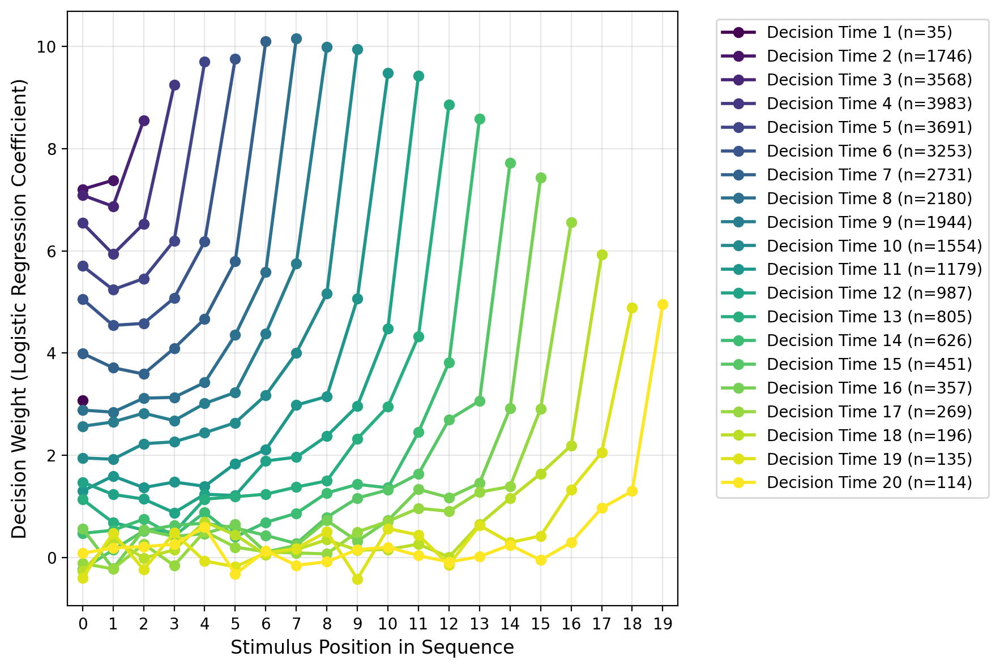

<Figure size 640x480 with 0 Axes>

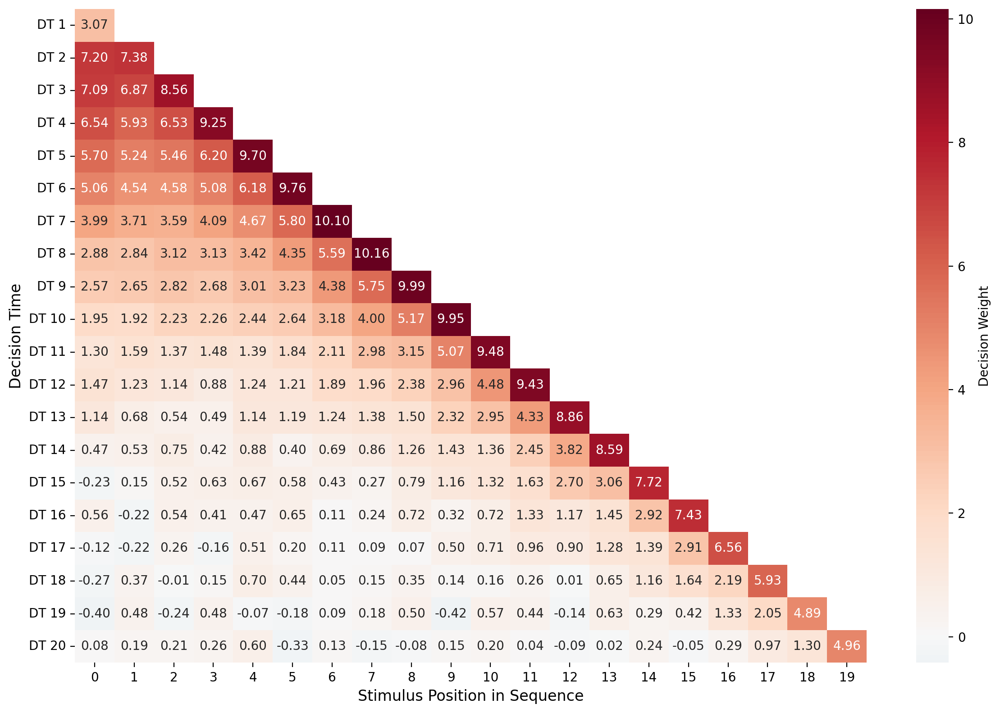

<Figure size 640x480 with 0 Axes>

In [49]:
import seaborn as sns

def plot_decision_weights(results):
    """Plot decision weights as a function of cue position for different decision times"""
    
    plt.figure(figsize=(9, 6))
    colors = plt.cm.viridis(np.linspace(0, 1, len(results)))
    max_position = 0
    
    for i, (dt, data) in enumerate(results.items()):
        positions = np.array(data['positions'])
        weights = np.array(data['coefficients'])
        
        min_len = min(len(positions), len(weights))
        positions = positions[:min_len]
        weights = weights[:min_len]
        
        plt.plot(positions, weights, 'o-', color=colors[i], 
                 label=f'Decision Time {dt} (n={data["n_samples"]})', 
                 linewidth=2, markersize=6)
        
        max_position = max(max_position, max(positions))
    
    plt.xlabel('Stimulus Position in Sequence', fontsize=12)
    plt.ylabel('Decision Weight (Logistic Regression Coefficient)', fontsize=12)
    # plt.title('Decision Weights by Stimulus Position Across Different Decision Times', fontsize=14)
    plt.grid(True, alpha=0.3)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xlim(-0.5, max_position + 0.5)
    plt.xticks(range(max_position + 1))
    plt.tight_layout()
    plt.show()
    
    return plt.gcf()

def plot_decision_weights_heatmap(results):
    """Create a heatmap showing decision weights across positions and decision times"""
    
    # Determine the maximum position across all decision times
    max_position = max(max(data['positions']) for data in results.values()) + 1
    decision_times = sorted(results.keys())
    
    # Create matrix for heatmap
    weight_matrix = np.full((len(decision_times), max_position), np.nan)
    
    for i, dt in enumerate(decision_times):
        if dt in results:
            positions = results[dt]['positions']
            weights = results[dt]['coefficients']
            for pos, weight in zip(positions, weights):
                weight_matrix[i, pos] = weight
    
    # Create heatmap
    plt.figure(figsize=(12, 8))
    
    # Create mask for missing values
    mask = np.isnan(weight_matrix)
    
    sns.heatmap(weight_matrix, 
                xticklabels=range(max_position),
                yticklabels=[f'DT {dt}' for dt in decision_times],
                cmap='RdBu_r', center=0, 
                annot=True, fmt='.2f',
                mask=mask,
                cbar_kws={'label': 'Decision Weight'})
    
    plt.xlabel('Stimulus Position in Sequence', fontsize=12)
    plt.ylabel('Decision Time', fontsize=12)
    # plt.title('Decision Weights Heatmap: Position × Decision Time', fontsize=14)
    plt.tight_layout()
    plt.show()
    
    return plt.gcf()

fig1 = plot_decision_weights(results)
fig2 = plot_decision_weights_heatmap(results)

## Hidden States

In [50]:
D = len(df.hidden_state.iloc[0])
hmat = np.vstack(df.hidden_state.values)
hcols = [f"h{i}" for i in range(D)]
df_h = pd.concat([df.drop("hidden_state", axis=1),
                  pd.DataFrame(hmat, columns=hcols)],
                 axis=1)

# 按 stimulus 分组
stats = df_h.groupby("current_stimulus")[hcols].agg(["mean","std"])
# stats

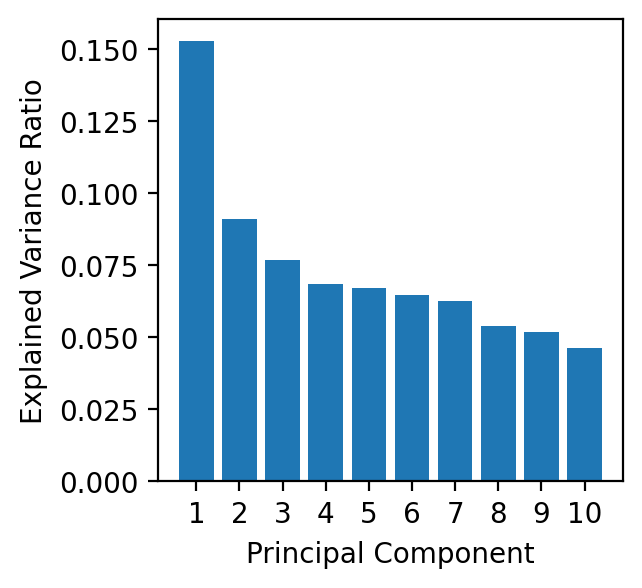

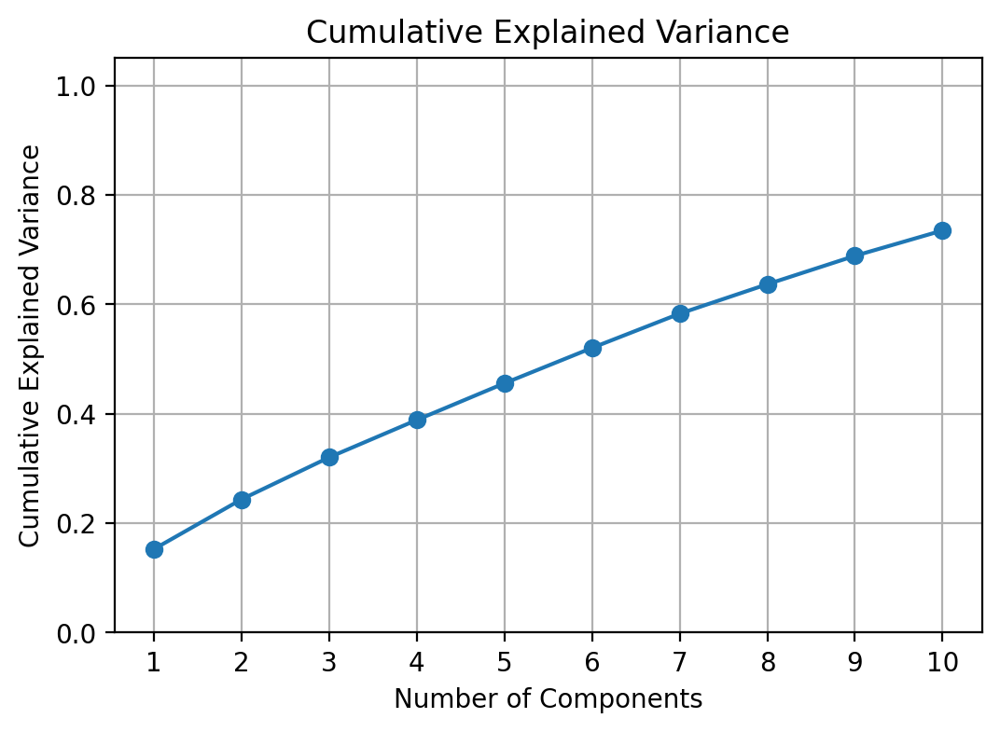

In [51]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

pca_full = PCA(n_components=X.shape[1])
pca_full.fit(X)

# 2. 取出各成分的解释方差比
ratios = pca_full.explained_variance_ratio_

# 3. 画碎石图（柱状）
plt.figure(figsize=(3,3))
plt.bar(np.arange(1, 10 + 1), ratios[:10], align='center')
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
# plt.title("Scree Plot")
plt.xticks(np.arange(1, 10 + 1))
plt.show()

# ——— 可选：画累计解释方差曲线 ———
cum_ratios = np.cumsum(ratios)
plt.figure(figsize=(6,4))
plt.plot(np.arange(1, 10 + 1), cum_ratios[:10], marker='o')
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("Cumulative Explained Variance")
plt.xticks(np.arange(1, 10 + 1))
plt.ylim(0,1.05)
plt.grid(True)
plt.show()

In [52]:
df.head()

,episode,correct_answer,stimuli_so_far,current_stimulus,action,reward,policy,hidden_state,decision_time,policy_1,policy_2,log_ratio,p_sample
0,0,1,[],-1,2,-0.05,"[2.97438e-05, 3.96241e-05, 0.9999306202]","[0.48027428980000003, -0.2562673092, 0.3711019...",5,2.974380e-05,0.000040,-0.286817,0.999931
1,0,1,[5],5,2,-0.06,"[1.7e-08, 3.13539e-05, 0.9999686480000001]","[0.6129333377, -0.2464112937, -0.5344952941000...",5,1.700000e-08,0.000031,-7.519881,0.999969
2,0,1,"[5, 4]",4,2,-0.07,"[4.1800000000000004e-08, 0.0008245662000000001...","[0.4195391536, -0.2442313731, -0.4529969394, 0...",5,4.180000e-08,0.000825,-9.889716,0.999175
3,0,1,"[5, 4, 4]",4,2,-0.08,"[4.13e-08, 0.0072386418, 0.9927613735]","[0.4163249731, -0.2411135137, -0.5588402152, 0...",5,4.130000e-08,0.007239,-12.074082,0.992761
4,0,1,"[5, 4, 4, 4]",4,2,-0.09,"[4.16e-08, 0.0521478653, 0.9478521347000001]","[0.4147548676, -0.23804342750000002, -0.664783...",5,4.160000e-08,0.052148,-14.041494,0.947852


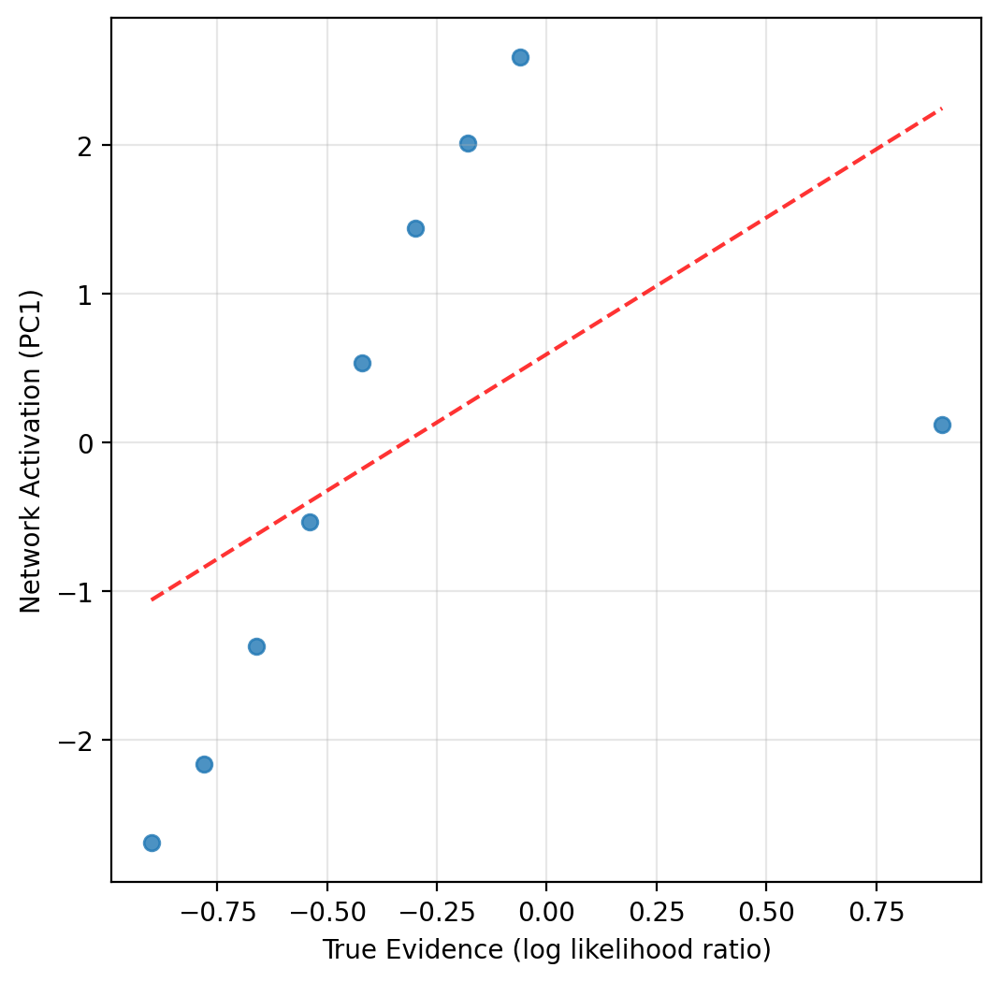

In [53]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
# %matplotlib widget

X = hmat  # shape (n_samples, D)
pca = PCA(n_components=1)
Z = pca.fit_transform(X)

df['PCA_1'] = Z

evidence_map = np.linspace(-0.9, 0.9, 16)

# Group data by current stimulus and calculate mean PCA activation
grouped = df.groupby('current_stimulus').agg({
    'PCA_1': 'mean'
}).reset_index()

# Create figure
plt.figure(figsize=(6,6))

# Plot scatter of mean PCA activation vs evidence for each stimulus
plt.scatter(evidence_map[grouped['current_stimulus'].astype(int)], 
           grouped['PCA_1'],
           alpha=0.8)

# Add line of best fit
z = np.polyfit(evidence_map[grouped['current_stimulus'].astype(int)], 
               grouped['PCA_1'], 1)
p = np.poly1d(z)
x_line = np.linspace(evidence_map.min(), evidence_map.max(), 100)
plt.plot(x_line, p(x_line), "r--", alpha=0.8)

plt.xlabel('True Evidence (log likelihood ratio)')
plt.ylabel('Network Activation (PC1)')
# plt.title('Network Activation vs True Evidence by Stimulus')
plt.grid(True, alpha=0.3)
plt.show()


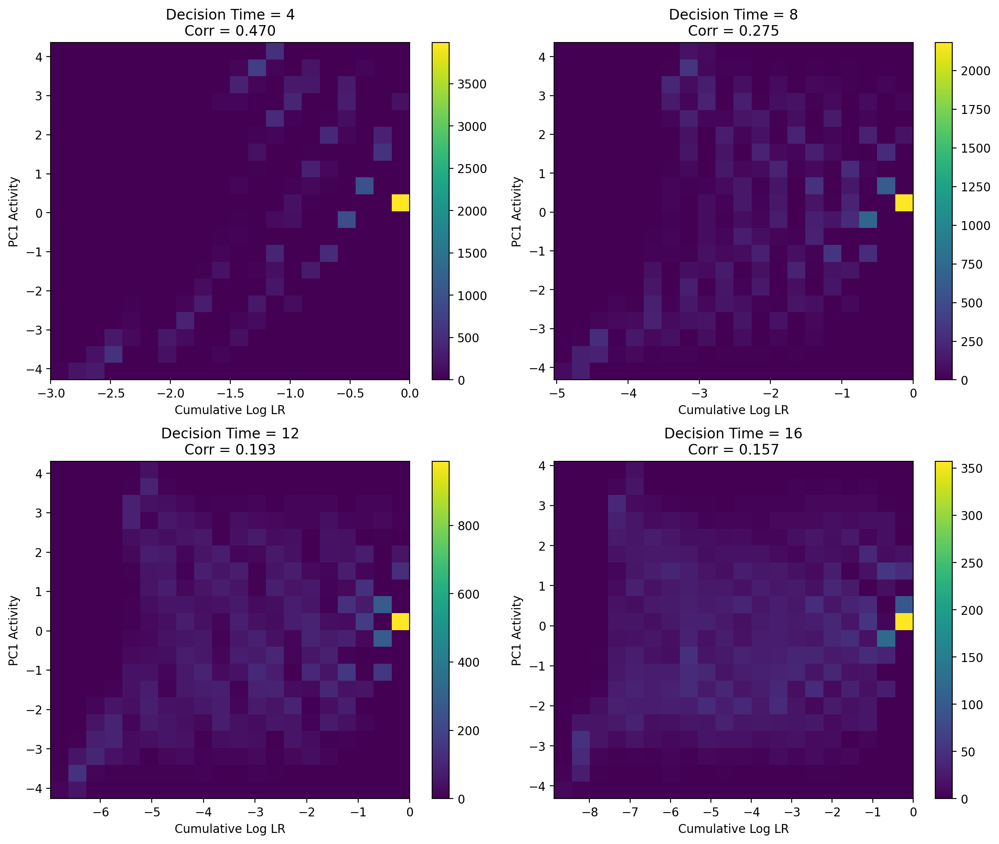

In [54]:
evidence_map = np.linspace(-0.9, 0.9, 16)

df['cum_logLR'] = df['stimuli_so_far'].apply(lambda x: sum(evidence_map[s] for s in x))

# Create figure with 3 subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()

# Decision times to analyze
decision_times = [4, 8, 12, 16]

for idx, dt in enumerate(decision_times):
    # Filter data for this decision time
    dt_data = df[df['decision_time'] == dt]
    
    # Create 2D histogram
    hist, xedges, yedges = np.histogram2d(
        dt_data['cum_logLR'],
        dt_data['PCA_1'],
        bins=20
    )
    
    # Calculate correlation coefficient
    corr = np.corrcoef(dt_data['cum_logLR'], dt_data['PCA_1'])[0,1]
    
    # Create heatmap
    im = axes[idx].imshow(hist.T, 
                         origin='lower',
                         aspect='auto',
                         extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],
                         cmap='viridis')
    
    axes[idx].set_xlabel('Cumulative Log LR')
    axes[idx].set_ylabel('PC1 Activity')
    axes[idx].set_title(f'Decision Time = {dt}\nCorr = {corr:.3f}')
    
    # Add colorbar
    plt.colorbar(im, ax=axes[idx])

plt.tight_layout()
plt.show()


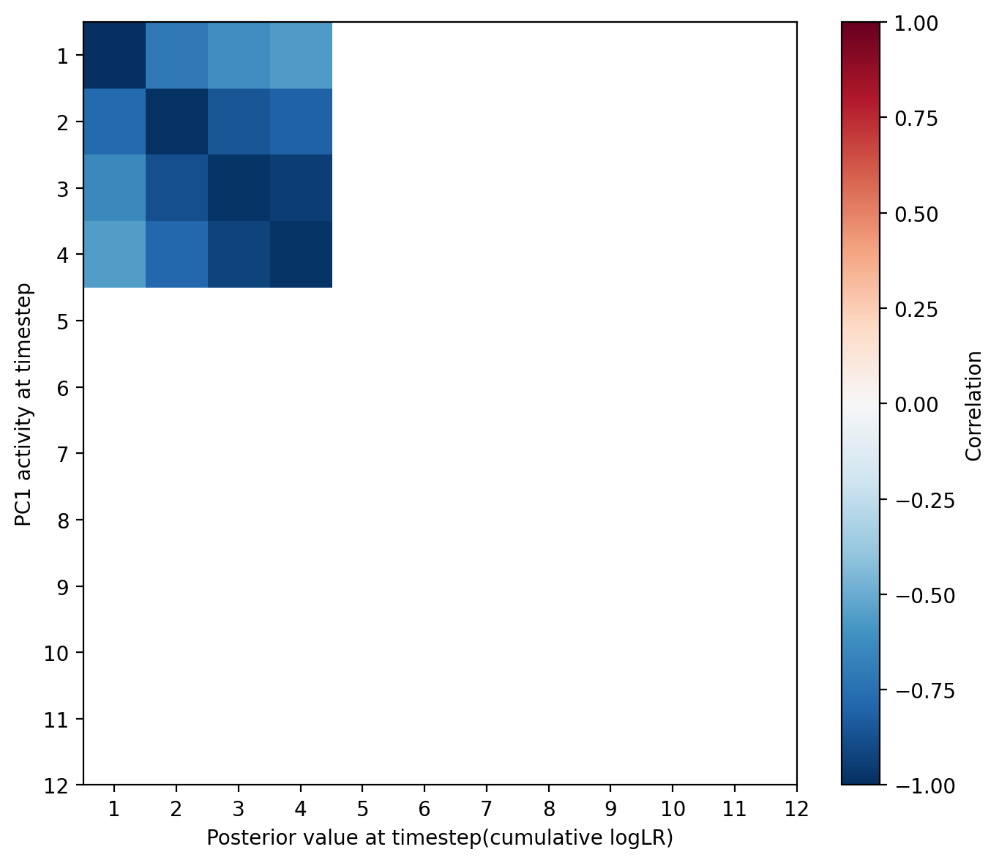

,episode,correct_answer,stimuli_so_far,current_stimulus,action,reward,policy,hidden_state,decision_time,policy_1,policy_2,log_ratio,PCA_1,cum_logLR,timestep
0,0,1,[9],9,0,0,"[0.9871844649, 0.0114417961, 0.001373709800000...","[0.181900993, 0.41962099080000004, 0.090306356...",4,0.011442,0.001374,2.119758,-0.527765,0.18,1
1,0,1,"[9, 9]",9,0,0,"[0.9656103849000001, 0.0341919884, 0.0001976165]","[0.1791154593, 0.4476056695, 0.203549936400000...",4,0.034192,0.000198,5.153418,-1.189677,0.36,2
2,0,1,"[9, 9, 8]",8,0,0,"[0.9434815049, 0.0564362854, 8.21881e-05]","[0.0744589046, 0.43054926400000004, 0.23447613...",4,0.056436,0.000082,6.531857,-1.536074,0.42,3
3,0,1,"[9, 9, 8, 10]",10,1,1,"[0.7965764403000001, 0.20340602100000002, 1.74...","[-0.0300476402, 0.4241915941, 0.3363825977, 0....",4,0.203406,0.000017,9.364474,-2.113001,0.72,4
27,5,2,[8],8,0,0,"[0.9928963780000001, 0.005212856, 0.0018908653...","[0.0850606933, 0.4411820769, 0.0428713784, 0.0...",4,0.005213,0.001891,1.014093,-0.287495,0.06,1


In [73]:
dt16_data = df[df['decision_time'] == 4].copy()
dt16_data['timestep'] = dt16_data['stimuli_so_far'].apply(len)

# Create correlation matrix for PCA_1 vs cum_logLR across timesteps
corr_matrix = np.zeros((4,4))

# Calculate correlations for each timestep combination
for i in range(1,5): # PCA_1 timestep
    pca_data = dt16_data[dt16_data['timestep'] == i]['PCA_1']
    
    for j in range(1,5): # cum_logLR timestep
        lr_data = dt16_data[dt16_data['timestep'] == j]['cum_logLR']
        
        # Only calculate correlation if we have data for both timesteps
        if len(pca_data) > 0 and len(lr_data) > 0:
            corr = np.corrcoef(pca_data, lr_data)[0,1]
            corr_matrix[i-1,j-1] = corr

# Create heatmap
plt.figure(figsize=(7,6))
im = plt.imshow(corr_matrix, cmap='RdBu_r', aspect='auto', vmin=-1, vmax=1)
plt.colorbar(im, label='Correlation')

plt.xlabel('Posterior value at timestep(cumulative logLR)')
plt.ylabel('PC1 activity at timestep') 
# plt.title('Correlation between PC1 and Posterior across Timesteps')

# Add ticks
plt.xticks(range(12), range(1,13))
plt.yticks(range(12), range(1,13))

plt.tight_layout()
plt.show()

dt16_data.head()

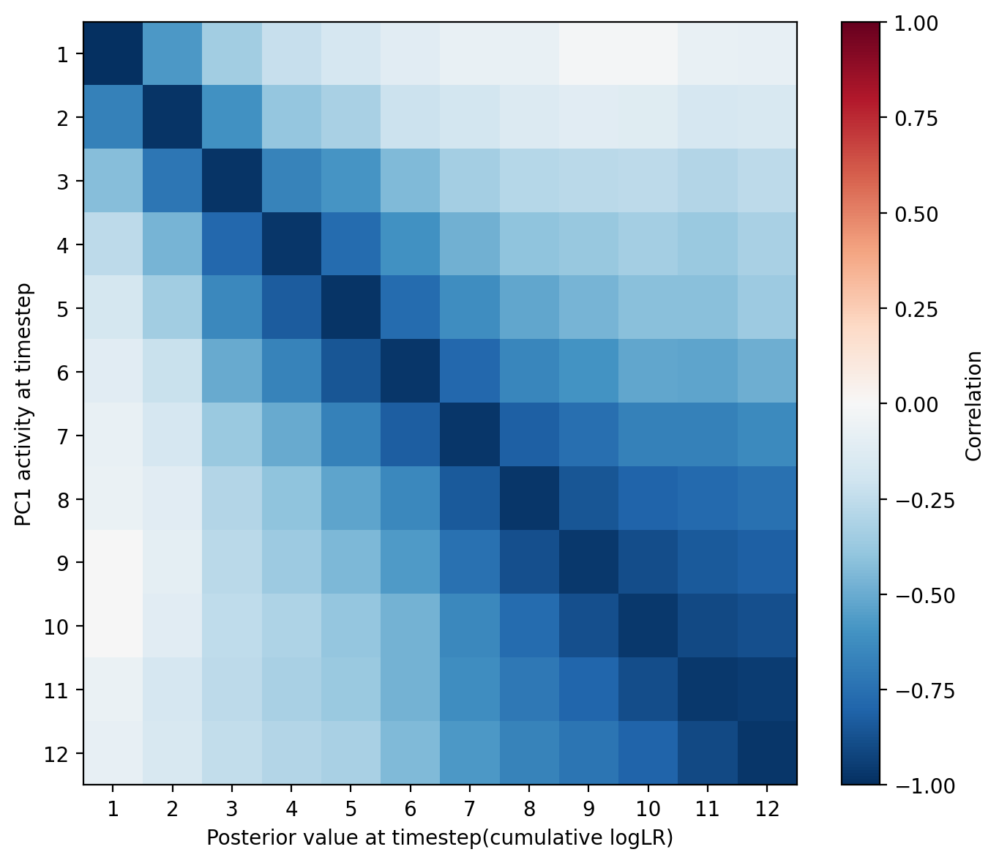

,episode,correct_answer,stimuli_so_far,current_stimulus,action,reward,policy,hidden_state,decision_time,policy_1,policy_2,log_ratio,PCA_1,cum_logLR,timestep
239,39,1,[7],7,0,0,"[0.9922543764, 0.0026517508000000003, 0.005093...","[0.24682842200000002, 0.4294991195, -0.0583833...",12,0.002652,0.005094,-0.652811,0.061624,-6.000000e-02,1
240,39,1,"[7, 10]",10,0,0,"[0.9834885001, 0.0158766042, 0.0006348501]","[0.003494706, 0.5207653642, 0.1261898875000000...",12,0.015877,0.000635,3.219213,-0.689935,2.400000e-01,2
241,39,1,"[7, 10, 4]",4,0,0,"[0.9892395735, 0.0011074820000000001, 0.009652...","[0.2378783375, 0.5128629208000001, -0.12060588...",12,0.001107,0.009653,-2.165174,0.326876,-1.800000e-01,3
242,39,1,"[7, 10, 4, 9]",9,0,0,"[0.9951869845, 0.0017913663, 0.003021643700000...","[0.2470213175, 0.563319087, 0.0064114295, -0.1...",12,0.001791,0.003022,-0.522822,0.074523,2.775558e-16,4
243,39,1,"[7, 10, 4, 9, 1]",1,0,0,"[0.6428575516, 3.87781e-05, 0.3571036756]","[0.4756259322, 0.5309580564, -0.3634921908, -0...",12,0.000039,0.357104,-9.127926,1.819700,-7.800000e-01,5


In [72]:
dt16_data = df[df['decision_time'] == 12].copy()
dt16_data['timestep'] = dt16_data['stimuli_so_far'].apply(len)

# Create correlation matrix for PCA_1 vs cum_logLR across timesteps
corr_matrix = np.zeros((12,12))

# Calculate correlations for each timestep combination
for i in range(1,13): # PCA_1 timestep
    pca_data = dt16_data[dt16_data['timestep'] == i]['PCA_1']
    
    for j in range(1,13): # cum_logLR timestep
        lr_data = dt16_data[dt16_data['timestep'] == j]['cum_logLR']
        
        # Only calculate correlation if we have data for both timesteps
        if len(pca_data) > 0 and len(lr_data) > 0:
            corr = np.corrcoef(pca_data, lr_data)[0,1]
            corr_matrix[i-1,j-1] = corr

# Create heatmap
plt.figure(figsize=(7,6))
im = plt.imshow(corr_matrix, cmap='RdBu_r', aspect='auto', vmin=-1, vmax=1)
plt.colorbar(im, label='Correlation')

plt.xlabel('Posterior value at timestep(cumulative logLR)')
plt.ylabel('PC1 activity at timestep') 
# plt.title('Correlation between PC1 and Posterior across Timesteps')

# Add ticks
plt.xticks(range(12), range(1,13))
plt.yticks(range(12), range(1,13))

plt.tight_layout()
plt.show()

dt16_data.head()

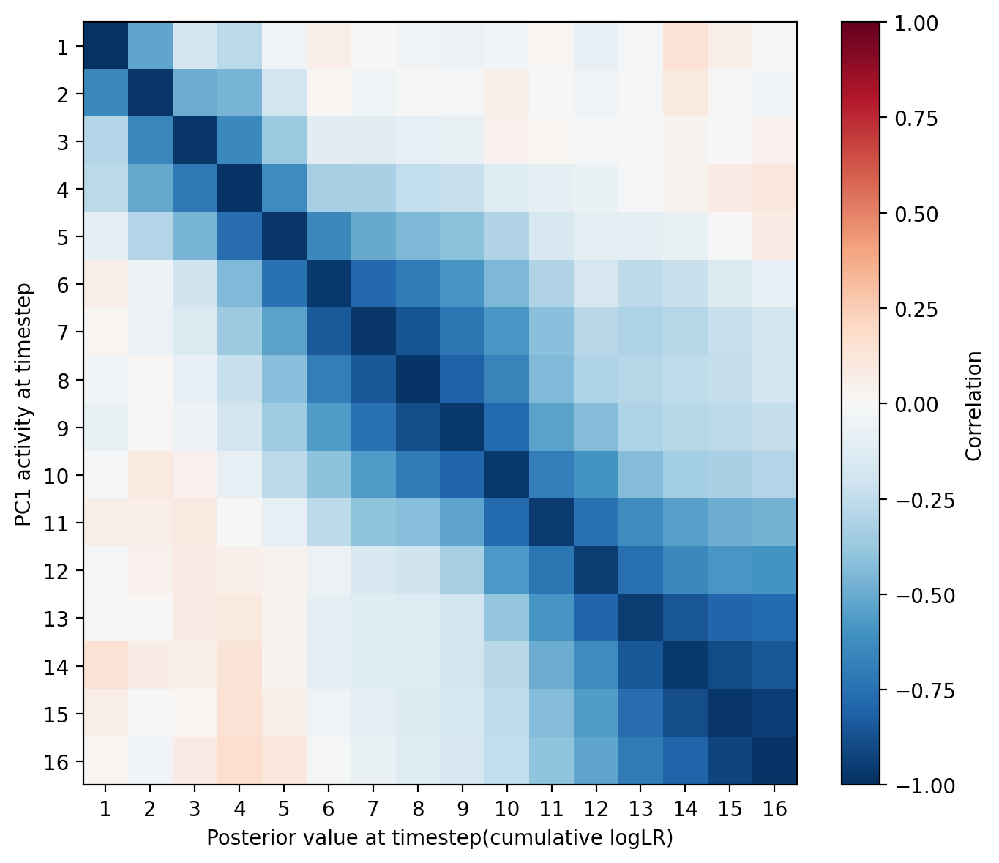

,episode,correct_answer,stimuli_so_far,current_stimulus,action,reward,policy,hidden_state,decision_time,policy_1,policy_2,log_ratio,PCA_1,cum_logLR,timestep
418,67,1,[13],13,0,0,"[0.7882978916000001, 0.2113319486, 0.000370124...","[-0.032125875400000004, 0.30798110370000004, 0...",16,0.211332,0.000370,6.347347,-1.347959,0.66,1
419,67,1,"[13, 5]",5,0,0,"[0.9623847008, 0.0371730439, 0.0004422804]","[0.1051031798, 0.3613960147, 0.1447851509, 0.2...",16,0.037173,0.000442,4.431395,-1.086294,0.36,2
420,67,1,"[13, 5, 7]",7,0,0,"[0.9819309711, 0.0176260341, 0.0004428905]","[0.1809670031, 0.39766001700000003, 0.04918983...",16,0.017626,0.000443,3.683810,-0.907602,0.30,3
421,67,1,"[13, 5, 7, 7]",7,0,0,"[0.9886533618000001, 0.0107386205, 0.0006079776]","[0.23093535010000002, 0.4261169732, -0.0002246...",16,0.010739,0.000608,2.871464,-0.731653,0.24,4
422,67,1,"[13, 5, 7, 7, 8]",8,0,0,"[0.9834212661, 0.016285842300000002, 0.0002928...","[0.0863671824, 0.4414010942, 0.1111777872, 0.2...",16,0.016286,0.000293,4.018288,-0.966222,0.30,5


In [71]:
dt16_data = df[df['decision_time'] == 16].copy()
dt16_data['timestep'] = dt16_data['stimuli_so_far'].apply(len)

# Create correlation matrix for PCA_1 vs cum_logLR across timesteps
corr_matrix = np.zeros((16,16))

# Calculate correlations for each timestep combination
for i in range(1,17): # PCA_1 timestep
    pca_data = dt16_data[dt16_data['timestep'] == i]['PCA_1']
    
    for j in range(1,17): # cum_logLR timestep
        lr_data = dt16_data[dt16_data['timestep'] == j]['cum_logLR']
        
        # Only calculate correlation if we have data for both timesteps
        if len(pca_data) > 0 and len(lr_data) > 0:
            corr = np.corrcoef(pca_data, lr_data)[0,1]
            corr_matrix[i-1,j-1] = corr

# Create heatmap
plt.figure(figsize=(7,6))
im = plt.imshow(corr_matrix, cmap='RdBu_r', aspect='auto', vmin=-1, vmax=1)
plt.colorbar(im, label='Correlation')

plt.xlabel('Posterior value at timestep(cumulative logLR)')
plt.ylabel('PC1 activity at timestep') 
# plt.title('Correlation between PC1 and Posterior across Timesteps')

# Add ticks
plt.xticks(range(16), range(1,17))
plt.yticks(range(16), range(1,17))

plt.tight_layout()
plt.show()

dt16_data.head()

IndexError: index 2 is out of bounds for axis 1 with size 2

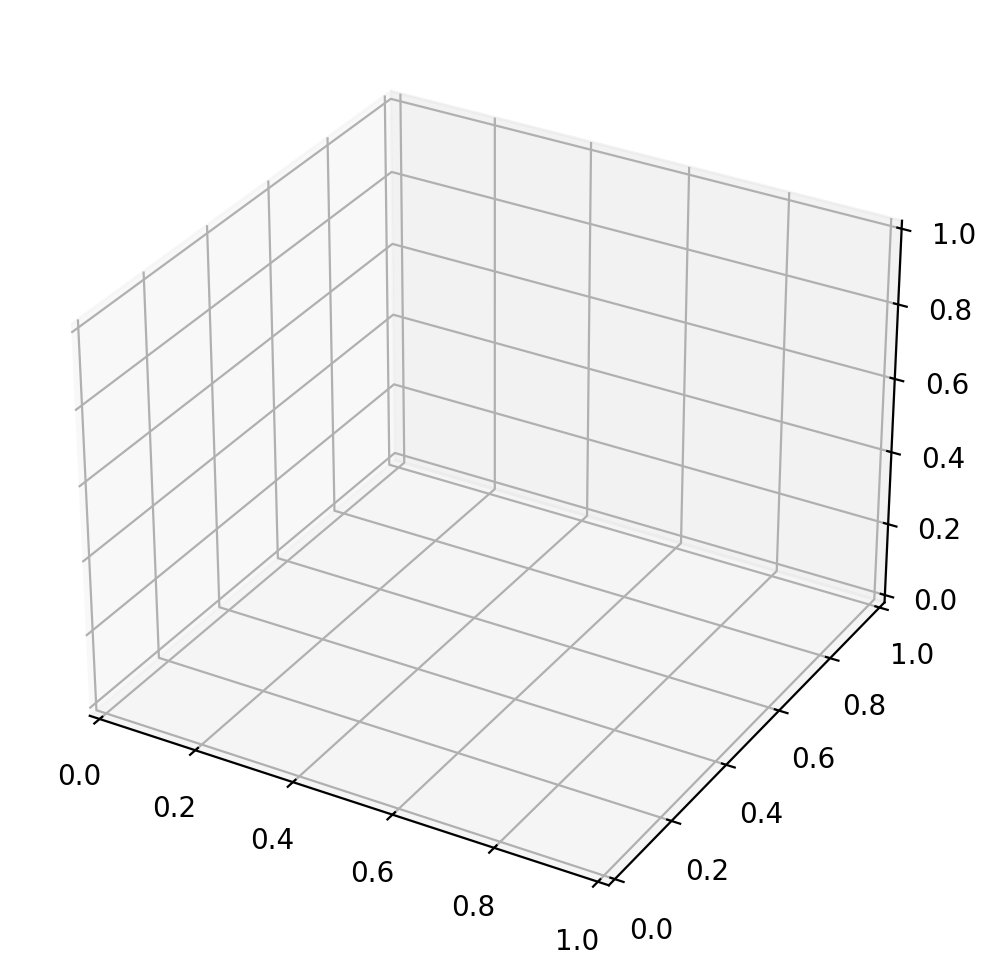

In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
# %matplotlib widget

X = hmat  # shape (n_samples, D)
pca = PCA(n_components=3)
Z = pca.fit_transform(X)

fig = plt.figure(figsize=(7,6))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(Z[:,0], Z[:,1], Z[:,2],
                c=df['current_stimulus'].astype(int),
                cmap='tab20', alpha=0.6, s=20)
cbar = fig.colorbar(sc, ax=ax, pad=0.1)
cbar.set_label('stimulus')
ax.set_xlabel('PC1'); ax.set_ylabel('PC2'); ax.set_zlabel('PC3')
plt.title('3D PCA of hidden states — interactive')
plt.tight_layout()
plt.show()

/var/folders/j5/y5g6mhcd7wg0lg4_wsdrql7r0000gn/T/ipykernel_3331/2471421764.py:29: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('1').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(Z[idx, 0], Z[idx, 1], Z[idx, 2],
/var/folders/j5/y5g6mhcd7wg0lg4_wsdrql7r0000gn/T/ipykernel_3331/2471421764.py:29: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('2').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(Z[idx, 0], Z[idx, 1], Z[idx, 2],


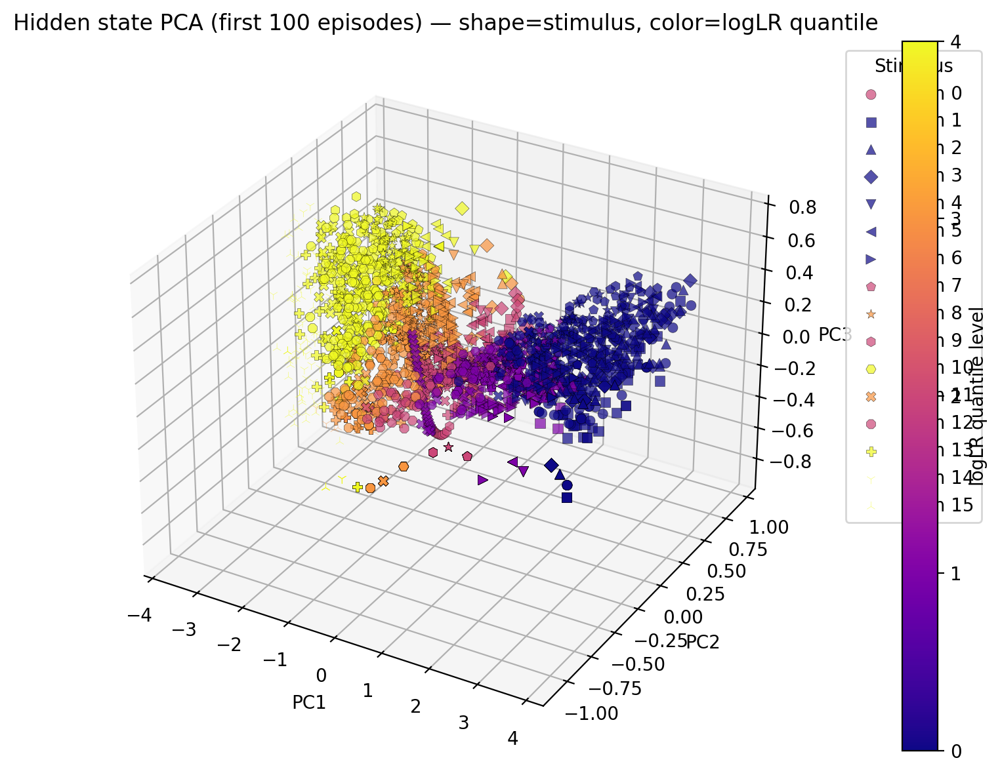

In [46]:
# 0. 仅保留前 100 个 episode 的数据
df_sub = df[df['episode'] < 500].copy()

# 1. 准备数据
X = np.vstack(df_sub['hidden_state'].values)
stimuli = df_sub['current_stimulus'].astype(int).values
logLR = df_sub['stimuli_so_far'].apply(lambda seq: sum(evidence_map[s] for s in seq)).values

# 2. 分 quantile
n_quantiles = 5
quantile_bins = pd.qcut(logLR, q=n_quantiles, labels=False)

# 3. PCA
pca = PCA(n_components=3)
Z = pca.fit_transform(X)

# 4. 可视化参数
unique_stimuli = np.sort(np.unique(stimuli))
markers = ['o', 's', '^', 'D', 'v', '<', '>', 'p', '*', 'h', 'H', 'X', '8', 'P', '1', '2']
cmap = plt.cm.plasma
norm = plt.Normalize(0, n_quantiles - 1)

# 5. 绘图
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

for i, stim in enumerate(unique_stimuli):
    idx = (stimuli == stim)
    ax.scatter(Z[idx, 0], Z[idx, 1], Z[idx, 2],
               c=cmap(norm(quantile_bins[idx])),
               marker=markers[i % len(markers)],
               edgecolors='k', linewidths=0.2,
               label=f'Stim {stim}', alpha=0.7, s=30)

# 6. 颜色条
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, pad=0.1, ticks=range(n_quantiles))
cbar.set_label("logLR quantile level")

# 7. 图标设置
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
plt.title("Hidden state PCA (first 100 episodes) — shape=stimulus, color=logLR quantile")
plt.legend(title="Stimulus", bbox_to_anchor=(1.05, 1), loc="upper left", ncol=1)
plt.tight_layout()
plt.show()

/Users/lijialin/miniconda3/envs/daily/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/var/folders/j5/y5g6mhcd7wg0lg4_wsdrql7r0000gn/T/ipykernel_12274/4165504159.py:40: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('1').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(subset['tSNE1'], subset['tSNE2'],
/var/folders/j5/y5g6mhcd7wg0lg4_wsdrql7r0000gn/T/ipykernel_12274/4165504159.py:40: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('2').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(subset['tSNE1'], subset['tSNE2'],


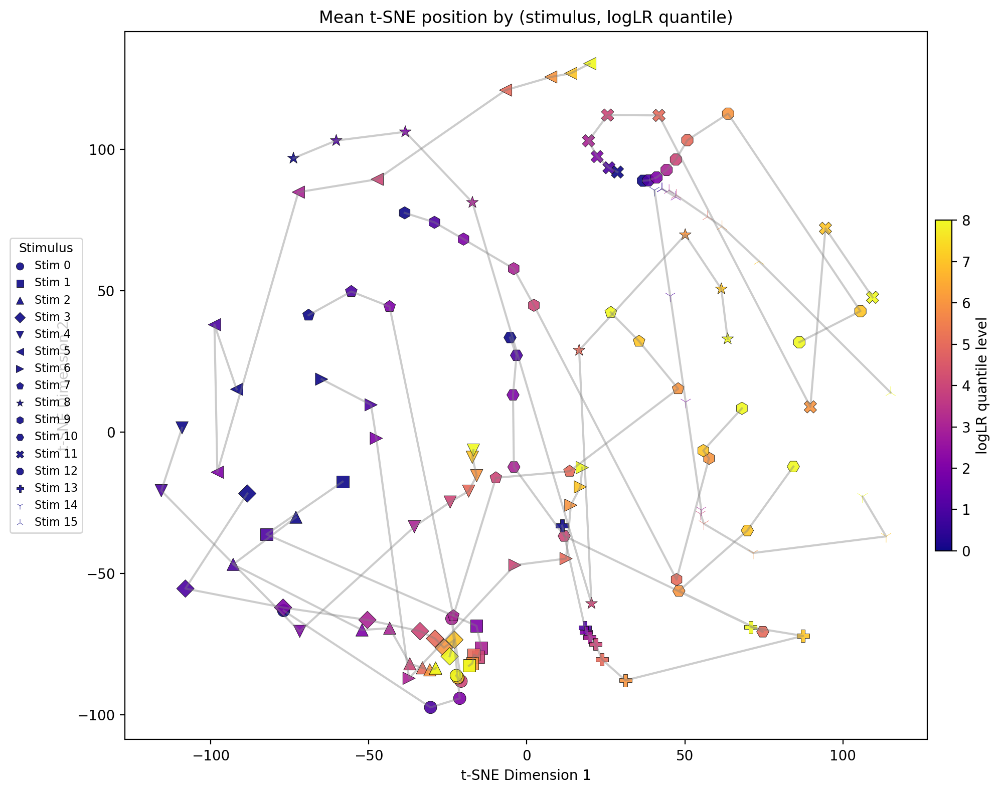

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.manifold import TSNE

# 0. 数据准备
df_sub = df.copy()
df_sub['logLR'] = df_sub['stimuli_so_far'].apply(lambda seq: sum(evidence_map[s] for s in seq))
n_quantiles = 9
df_sub['logLR_quantile'] = pd.qcut(df_sub['logLR'], q=n_quantiles, labels=False)

# 1. 拼接 hidden state
X = np.vstack(df_sub['hidden_state'].values)
stimuli = df_sub['current_stimulus'].astype(int).values
logLR_q = df_sub['logLR_quantile'].values

# 2. t-SNE 降维到 2D
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
Z = tsne.fit_transform(X)

# 3. 合成 DataFrame
df_tsne = pd.DataFrame(Z, columns=['tSNE1', 'tSNE2'])
df_tsne['stimulus'] = stimuli
df_tsne['logLR_q'] = logLR_q

# 4. 每个 stimulus × quantile 的 tSNE 平均
grouped = df_tsne.groupby(['stimulus', 'logLR_q'])[['tSNE1','tSNE2']].mean().reset_index()

# 5. 可视化参数
markers = ['o', 's', '^', 'D', 'v', '<', '>', 'p', '*', 'h', 'H', 'X', '8', 'P', '1', '2']
cmap = plt.cm.plasma
norm = plt.Normalize(0, n_quantiles - 1)

# 6. 绘图
plt.figure(figsize=(10, 8))
for i, stim in enumerate(sorted(grouped['stimulus'].unique())):
    subset = grouped[grouped['stimulus'] == stim]
    
    # 绘制点
    plt.scatter(subset['tSNE1'], subset['tSNE2'],
                c=cmap(norm(subset['logLR_q'])),
                marker=markers[i % len(markers)],
                s=80, edgecolors='k', linewidths=0.3, alpha=0.9,
                label=f'Stim {stim}')
    
    # 连线
    subset_sorted = subset.sort_values('logLR_q')
    plt.plot(subset_sorted['tSNE1'], subset_sorted['tSNE2'],
             color='gray', linestyle='-', linewidth=1.5, alpha=0.4)

# 7. 颜色条
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
# cbar = plt.colorbar(sm, pad=0.01, fraction=0.02)
cbar = plt.colorbar(sm, ax=plt.gca(), pad=0.01, fraction=0.02)
cbar.set_label("logLR quantile level")

# 8. 图设置
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.title("Mean t-SNE position by (stimulus, logLR quantile)")

# 图例在左侧
plt.legend(
    title="Stimulus",
    bbox_to_anchor=(-0.15, 0.5),
    loc="center left",
    fontsize=8,
    title_fontsize=9,
    markerscale=0.6,
    handlelength=1.0,
    borderaxespad=0.5
)

plt.tight_layout()
plt.show()

/Users/lijialin/miniconda3/envs/daily/lib/python3.10/site-packages/ternary/plotting.py:148: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax.scatter(xs, ys, vmin=vmin, vmax=vmax, **kwargs)


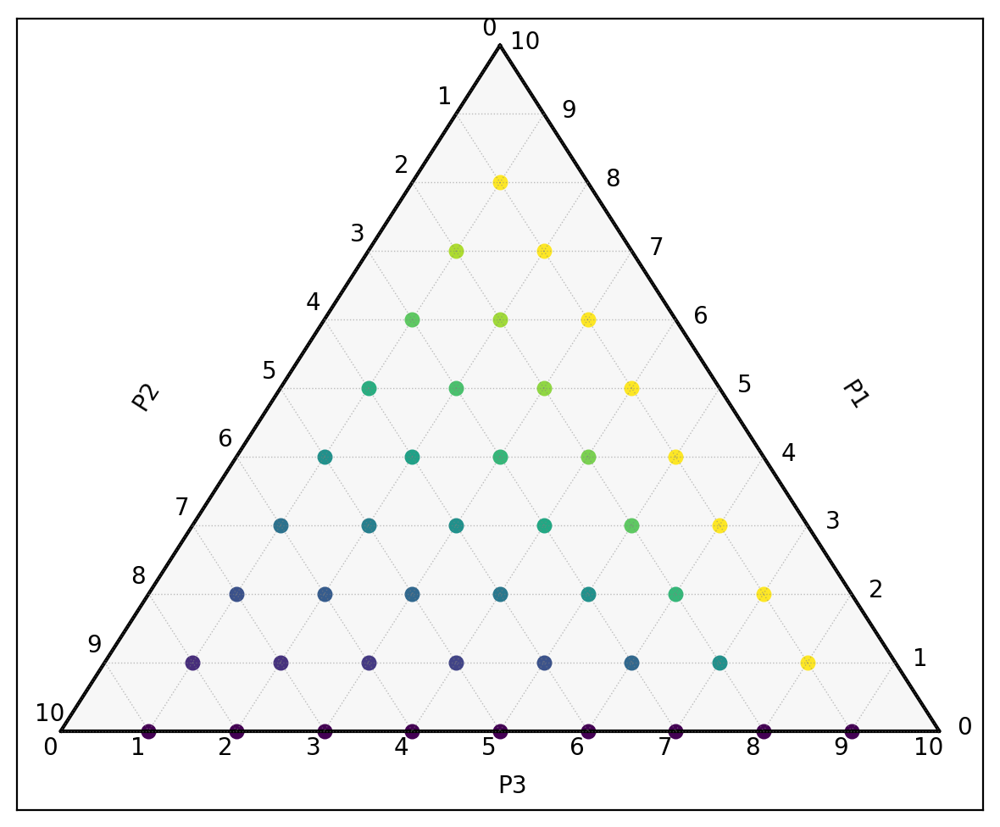

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import ternary

# 设置 ternary 图参数
scale = 10  # 决定了 (p1+p2+p3)=scale，即分辨率

# 创建图像
fig, tax = ternary.figure(scale=scale)
fig.set_size_inches(6, 5)

# 画边框和网格
tax.boundary(linewidth=1.5)
tax.gridlines(multiple=1, color="gray", linewidth=0.5, alpha=0.5)

# 设置坐标轴标签
tax.left_axis_label("P2", offset=0.16)
tax.right_axis_label("P1", offset=0.16)
tax.bottom_axis_label("P3", offset=-0.05)

# 去除 ticks
tax.ticks(axis='lbr', linewidth=0, multiple=1)
tax.clear_matplotlib_ticks()

# 绘制多条路径
for i in range(1, scale):
    path = []
    for j in range(scale - i):
        p1 = i
        p2 = j
        p3 = scale - i - j
        if p3 < 0:
            continue
        path.append((p1, p2, p3))  # 注意：ternary坐标为 (left, right, bottom)

    # 用 value 映射颜色
    values = np.linspace(0, 1, len(path))
    colors = [plt.cm.viridis(v) for v in values]

    # 逐点绘制
    for pt, c in zip(path, colors):
        tax.scatter([pt], marker='o', color=c, s=30)

# 最后设置图形属性
tax._redraw_labels()
plt.tight_layout()
plt.show()

/var/folders/j5/y5g6mhcd7wg0lg4_wsdrql7r0000gn/T/ipykernel_12274/452981228.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['policy'] = data['policy'].apply(lambda x: np.array(x))
/var/folders/j5/y5g6mhcd7wg0lg4_wsdrql7r0000gn/T/ipykernel_12274/452981228.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['logLR'] = data['stimuli_so_far'].apply(lambda seq: sum(evidence_map[s] for s in seq))
/Users/lijialin/miniconda3/envs/daily/lib/python3.10/site-packages/ternary/plotting.py:148: UserWarning

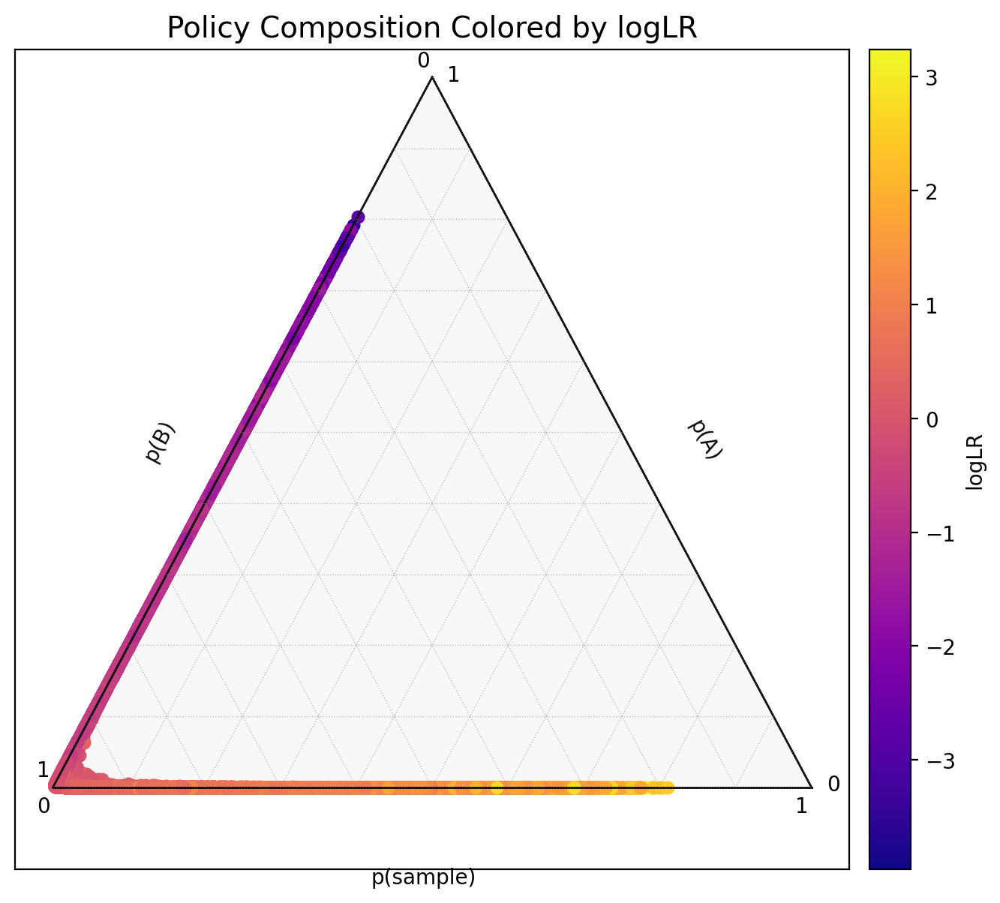

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import ternary
from matplotlib.colors import Normalize
from matplotlib.cm import plasma

# DataFrame df 已包含：
# 'policy' (list 或 array [p_sample, p_A, p_B]),
# 'stimuli_so_far' 用于计算 logLR

# 1. 拆分 policy 并计算 logLR
data['policy'] = data['policy'].apply(lambda x: np.array(x))
evidence_map = np.linspace(-0.9, 0.9, 16)  # 根据实际定义
data['logLR'] = data['stimuli_so_far'].apply(lambda seq: sum(evidence_map[s] for s in seq))

# 2. 配置颜色映射
norm = Normalize(vmin=df['logLR'].min(), vmax=df['logLR'].max())
cmap = plasma

# 3. 绘制 ternary 散点图
fig, tax = ternary.figure(scale=1.0)
fig.set_size_inches(7, 6)
tax.boundary(linewidth=1.0)
tax.gridlines(multiple=0.1, color="gray", alpha=0.5)
tax.left_axis_label("p(B)", offset=0.12)
tax.right_axis_label("p(A)", offset=0.12)
tax.bottom_axis_label("p(sample)", offset=0.04)
tax.set_title("Policy Composition Colored by logLR", fontsize=14)

# 遍历所有 trial
for _, row in df.iterrows():
    p = row['policy']
    point = (p[1], p[2], p[0])  # (p_A, p_B, p_sample)
    color = cmap(norm(row['logLR']))
    tax.scatter([point], marker='o', color=color, s=30)

# 添加颜色条
sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array(df['logLR'])
cbar = fig.colorbar(sm, ax=tax.get_axes(), orientation='vertical', pad=0.02)
cbar.set_label('logLR')

# add ticks
tax.ticks(axis='lbr', linewidth=0, multiple=1)
tax.clear_matplotlib_ticks()
plt.tight_layout()
plt.show()

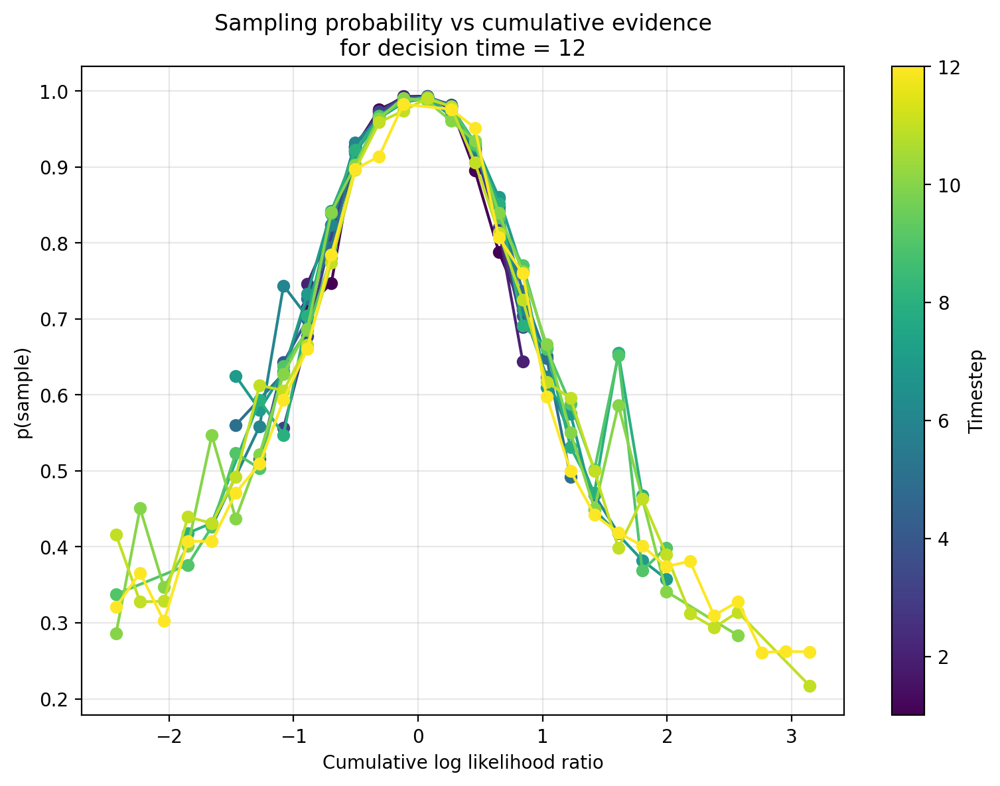

In [81]:
from matplotlib.colors import Normalize
from matplotlib.cm import viridis

df['p_sample'] = df['policy'].apply(lambda x: x[0])

# Filter episodes with decision_time == 12
dt12_data = df[df['decision_time'] == 12].copy()
dt12_data['timestep'] = dt12_data['stimuli_so_far'].apply(len)

# Define bins for cum_logLR
n_bins = 30
logLR_bins = np.linspace(dt12_data['cum_logLR'].min(), dt12_data['cum_logLR'].max(), n_bins + 1)

# Bin the cum_logLR values
dt12_data['logLR_bin'] = pd.cut(dt12_data['cum_logLR'], bins=logLR_bins, include_lowest=True)

# Group by timestep and logLR bins, calculate mean p_sample
grouped_data = (dt12_data.groupby(['timestep', 'logLR_bin'], observed=True)['p_sample']
                        .mean()
                        .reset_index())
grouped_data['bin_center'] = grouped_data['logLR_bin'].apply(lambda x: x.mid)

# Set up plot
fig, ax = plt.subplots(figsize=(8, 6))

# Create colormap based on timesteps
timesteps = sorted(grouped_data['timestep'].unique())
cmap = plt.cm.viridis
norm = Normalize(vmin=min(timesteps), vmax=max(timesteps))
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)

# Plot lines for each timestep
for t in timesteps:
    subset = grouped_data[grouped_data['timestep'] == t]
    ax.plot(subset['bin_center'], 
            subset['p_sample'],
            marker='o',
            color=cmap(norm(t)),
            label=f'timestep {t}')

# Customize plot
ax.set_xlabel('Cumulative log likelihood ratio')
ax.set_ylabel('p(sample)')
ax.set_title('Sampling probability vs cumulative evidence\nfor decision time = 12')
ax.grid(True, alpha=0.3)

# Add colorbar
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label('Timestep')

plt.tight_layout()
plt.show()


In [83]:
df

,episode,correct_answer,stimuli_so_far,current_stimulus,action,reward,policy,hidden_state,decision_time,policy_1,policy_2,log_ratio,PCA_1,cum_logLR,p_sample
0,0,1,[9],9,0,0,"[0.9871844649, 0.0114417961, 0.001373709800000...","[0.181900993, 0.41962099080000004, 0.090306356...",4,0.011442,0.001374,2.119758,-0.527765,1.800000e-01,0.987184
1,0,1,"[9, 9]",9,0,0,"[0.9656103849000001, 0.0341919884, 0.0001976165]","[0.1791154593, 0.4476056695, 0.203549936400000...",4,0.034192,0.000198,5.153418,-1.189677,3.600000e-01,0.965610
2,0,1,"[9, 9, 8]",8,0,0,"[0.9434815049, 0.0564362854, 8.21881e-05]","[0.0744589046, 0.43054926400000004, 0.23447613...",4,0.056436,0.000082,6.531857,-1.536074,4.200000e-01,0.943482
3,0,1,"[9, 9, 8, 10]",10,1,1,"[0.7965764403000001, 0.20340602100000002, 1.74...","[-0.0300476402, 0.4241915941, 0.3363825977, 0....",4,0.203406,0.000017,9.364474,-2.113001,7.200000e-01,0.796576
4,1,1,[7],7,0,0,"[0.9922543764, 0.0026517508000000003, 0.005093...","[0.24682842200000002, 0.4294991195, -0.0583833...",11,0.002652,0.005094,-0.652811,0.061624,-6.000000e-02,0.992254
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61411,9999,2,"[8, 9, 9, 7, 3, 7, 7, 8, 11, 5, 8, 7]",7,0,0,"[0.9922320843, 0.0013645226, 0.0064033535]","[0.29732197520000003, 0.5282686949000001, -0.1...",16,0.001365,0.006403,-1.546017,0.271501,-1.200000e-01,0.992232
61412,9999,2,"[8, 9, 9, 7, 3, 7, 7, 8, 11, 5, 8, 7, 7]",7,0,0,"[0.9886927605, 0.0009844442, 0.010322753300000...","[0.3321740031, 0.5337091684, -0.1399844885, -0...",16,0.000984,0.010323,-2.350029,0.455786,-1.800000e-01,0.988693
61413,9999,2,"[8, 9, 9, 7, 3, 7, 7, 8, 11, 5, 8, 7, 7, 9]",9,0,0,"[0.9926394224, 0.00431355, 0.0030470171]","[0.2456198037, 0.5416570306, 0.020817015300000...",16,0.004314,0.003047,0.347598,-0.099788,6.661338e-16,0.992639
61414,9999,2,"[8, 9, 9, 7, 3, 7, 7, 8, 11, 5, 8, 7, 7, 9, 1]",1,0,0,"[0.6286077499, 9.031410000000001e-05, 0.371301...","[0.4562838972, 0.491649121, -0.346924215600000...",16,0.000090,0.371302,-8.321477,1.629707,-7.800000e-01,0.628608


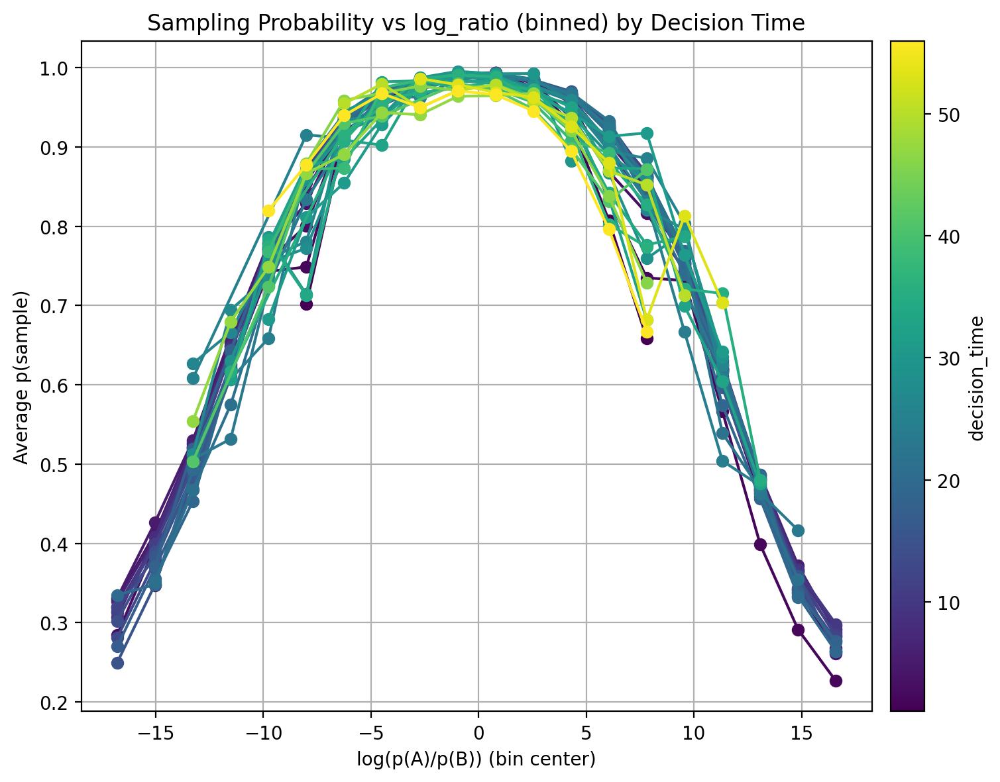

In [84]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import Normalize

# 假设 df 已包含 'log_ratio_AB', 'p_sample', 'decision_time'

# 1. 定义 bins 数量并生成边界
n_bins = 20
bin_edges = np.linspace(df['log_ratio'].min(), df['log_ratio'].max(), n_bins + 1)

# 2. 分箱并计算平均采样概率
df['log_bin'] = pd.cut(df['log_ratio'], bins=bin_edges, include_lowest=True)
df_binned = (
    df.dropna(subset=['log_bin'])
      .groupby(['decision_time', 'log_bin'], observed=True)['p_sample']
      .mean()
      .reset_index()
)
df_binned['bin_center'] = df_binned['log_bin'].apply(lambda iv: iv.mid)

# 3. 配置 colormap
dt_values = sorted(df_binned['decision_time'].unique())
cmap = cm.viridis
norm = Normalize(vmin=min(dt_values), vmax=max(dt_values))
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

# 4. 绘图
fig, ax = plt.subplots(figsize=(8, 6))
for dt in dt_values:
    subset = df_binned[df_binned['decision_time'] == dt]
    ax.plot(subset['bin_center'],
            subset['p_sample'],
            marker='o',
            color=cmap(norm(dt)),
            label=f'dt={dt}')

ax.set_xlabel('log(p(A)/p(B)) (bin center)')
ax.set_ylabel('Average p(sample)')
ax.set_title('Sampling Probability vs log_ratio (binned) by Decision Time')
ax.grid(True)

# 5. 添加 colorbar，指定 ax
cbar = fig.colorbar(sm, ax=ax, pad=0.02)
cbar.set_label('decision_time')

# ax.legend(title='decision_time', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

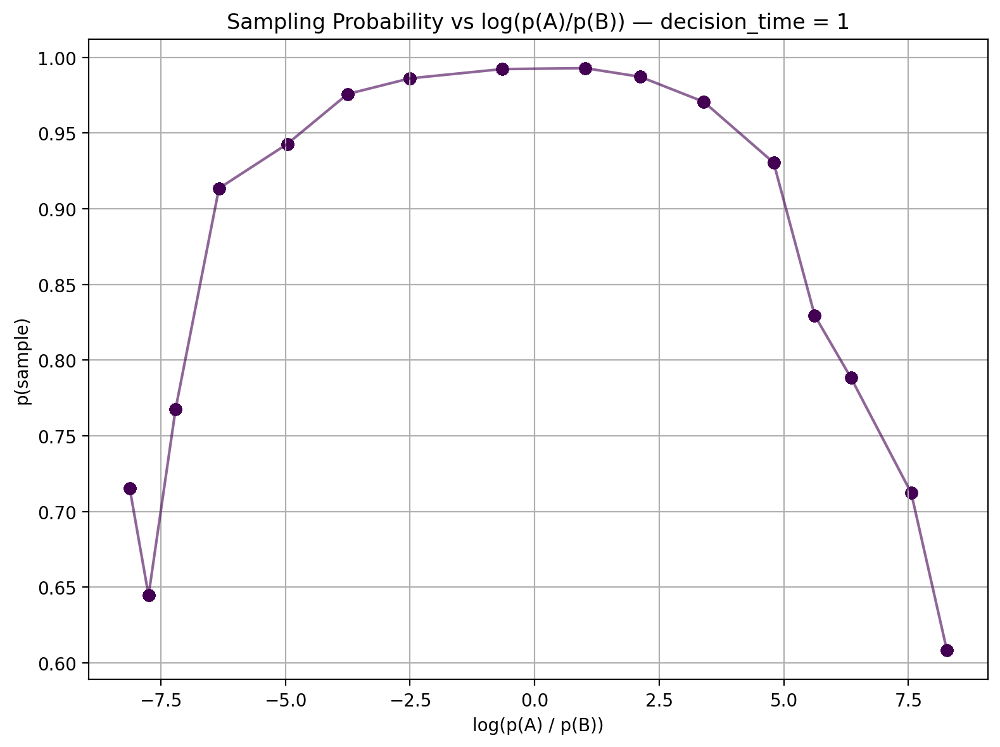

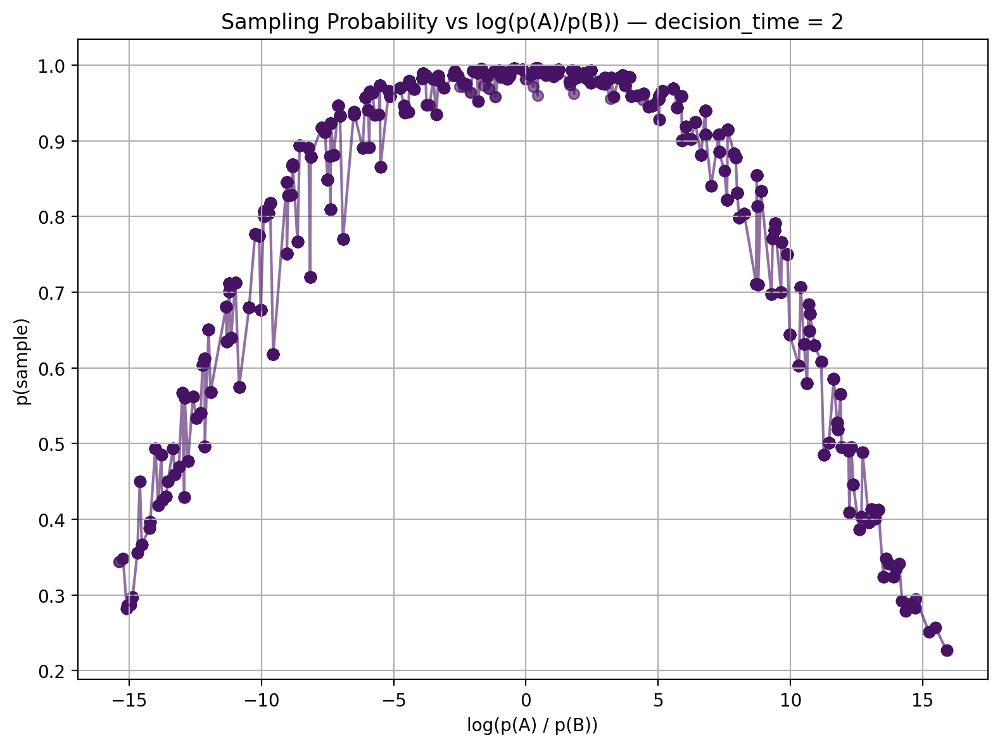

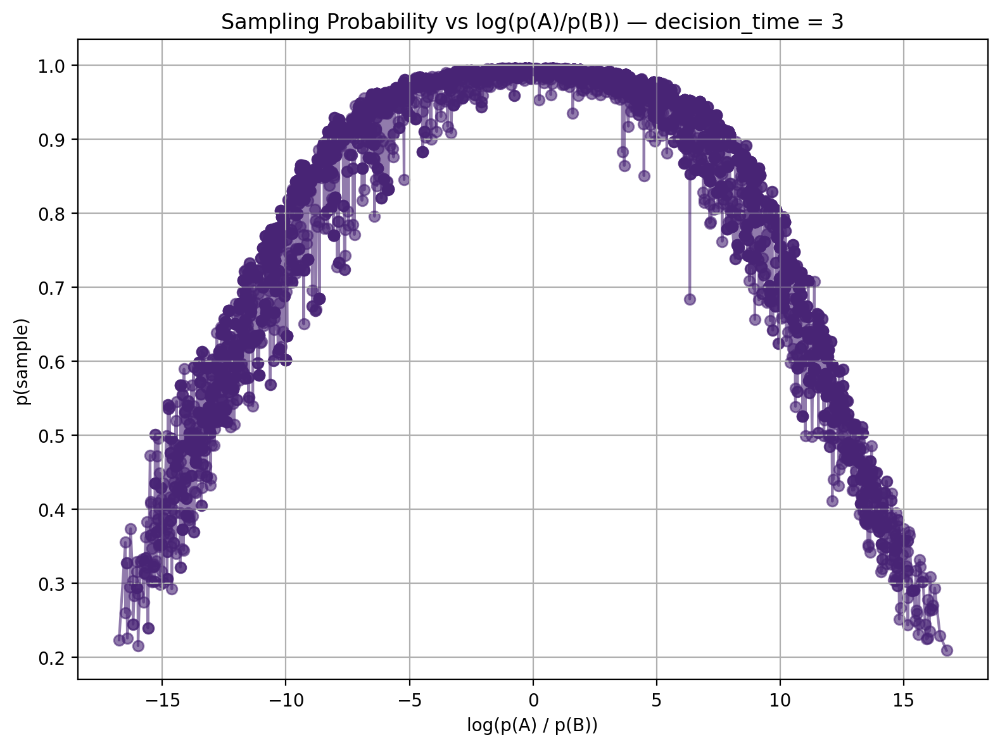

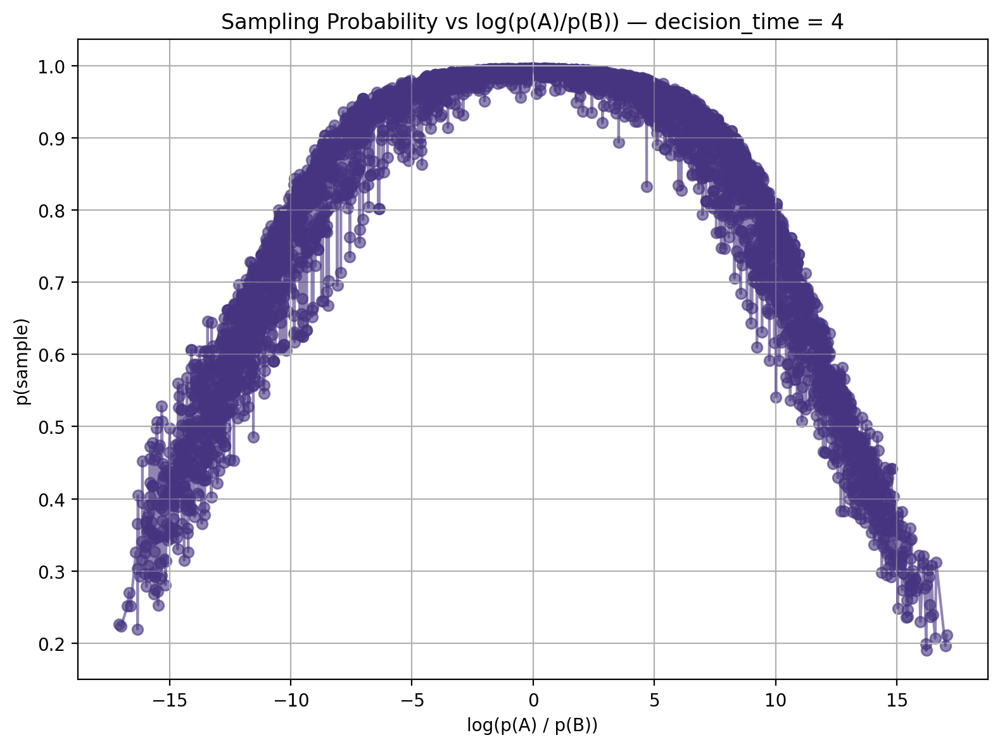

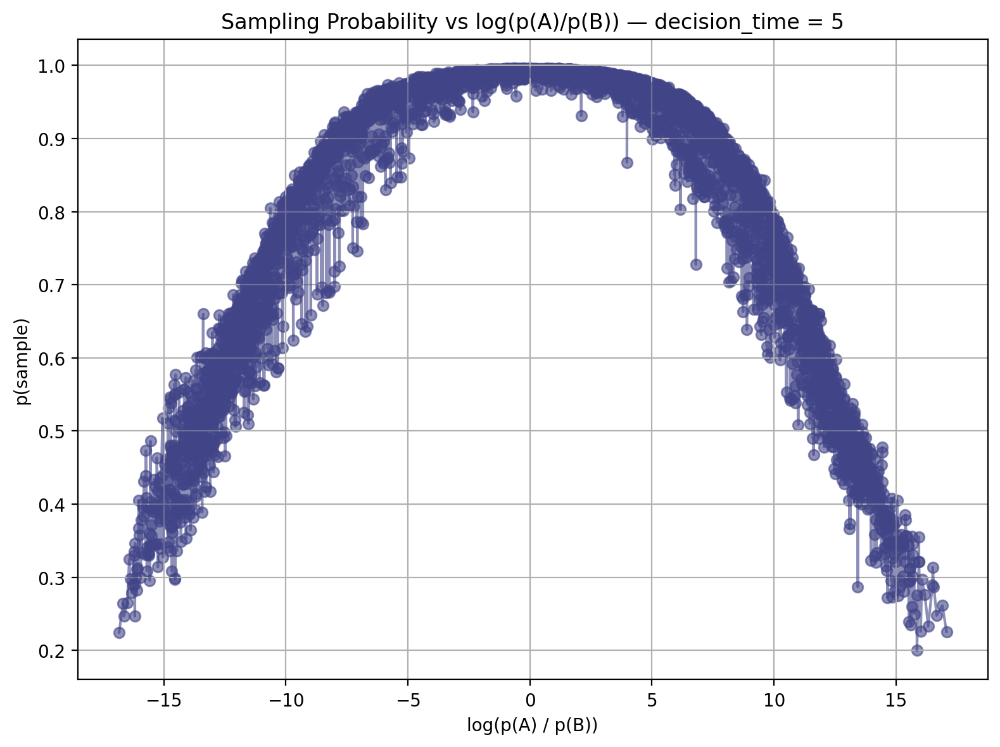

...

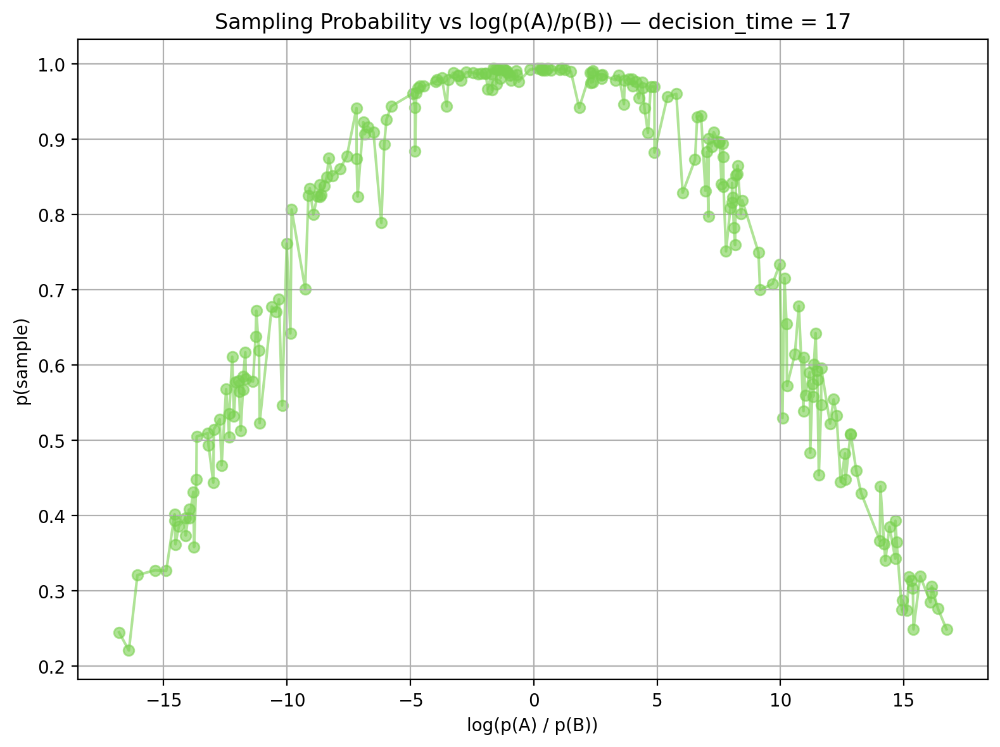

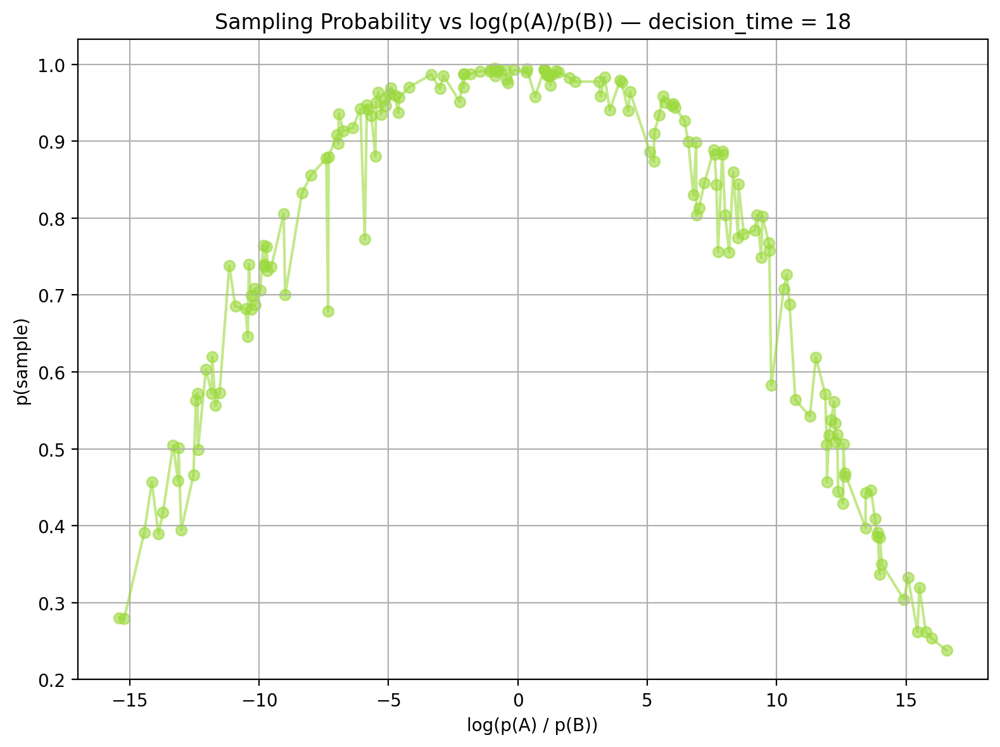

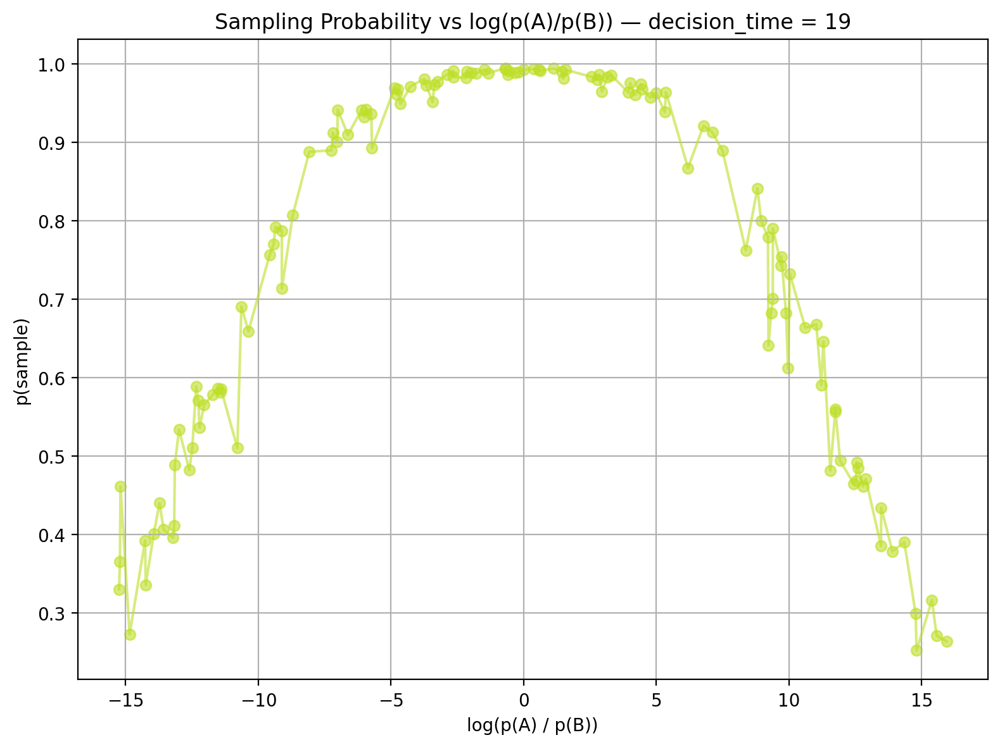

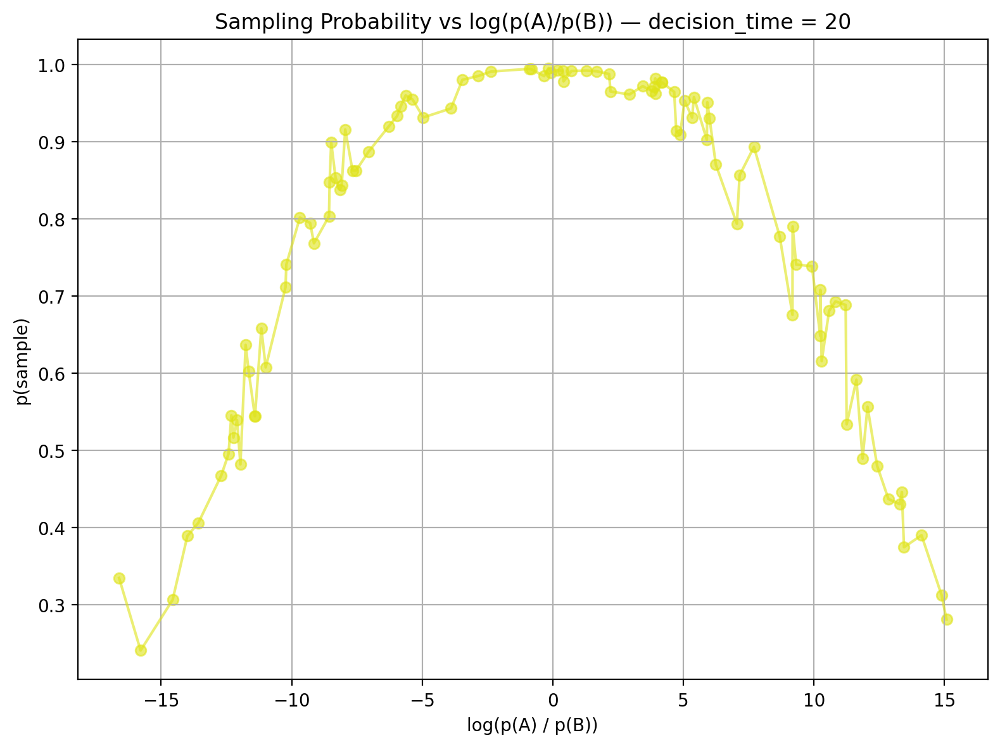

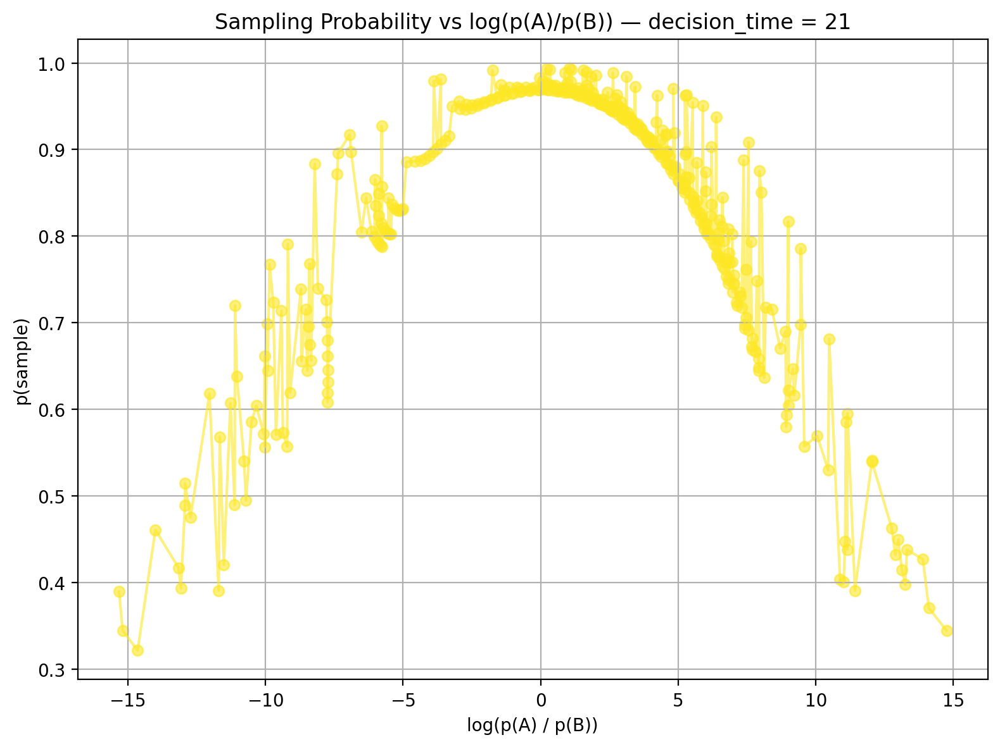

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# 1. 拆分 policy
df['policy_array'] = df['policy'].apply(lambda x: np.array(x))
df['p_sample'] = df['policy_array'].apply(lambda x: x[0])
df['p_A']      = df['policy_array'].apply(lambda x: x[1])
df['p_B']      = df['policy_array'].apply(lambda x: x[2])

# 2. 计算 log 比值
eps = 1e-8
df['log_ratio_AB'] = np.log((df['p_A'] + eps) / (df['p_B'] + eps))

# 3. 准备 colormap
dt_values = sorted(df['decision_time'].unique())
cmap = cm.viridis
norm = plt.Normalize(vmin=min(dt_values), vmax=max(dt_values))

# 4. 分别为每个 decision_time 画一张图
for dt in dt_values:
    df_dt = df[df['decision_time'] == dt]
    if df_dt.empty:
        continue

    plt.figure(figsize=(8, 6))
    color = cmap(norm(dt))

    x = df_dt['log_ratio_AB']
    y = df_dt['p_sample']

    # 散点 + 折线
    plt.scatter(x, y, color=color, alpha=0.6)
    df_sorted = df_dt.sort_values('log_ratio_AB')
    plt.plot(df_sorted['log_ratio_AB'], df_sorted['p_sample'], color=color, alpha=0.6)

    plt.xlabel('log(p(A) / p(B))')
    plt.ylabel('p(sample)')
    plt.title(f'Sampling Probability vs log(p(A)/p(B)) — decision_time = {dt}')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

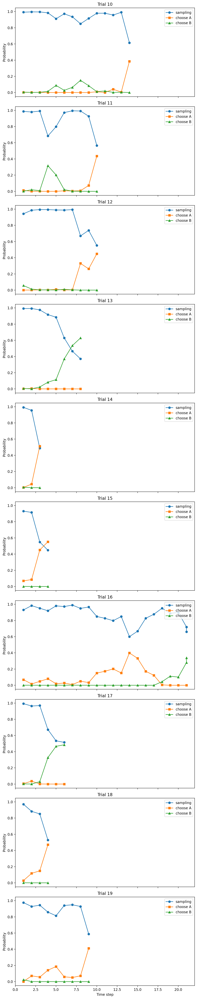

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# 确保 policy 为 numpy array，并计算 time_step
df['policy'] = df['policy'].apply(lambda x: np.array(x))
df['time_step'] = df['stimuli_so_far'].apply(len)

# 选择若干 trial（这里取前3个）
episodes = df['episode'].unique()[10:20]

# 创建子图
fig, axes = plt.subplots(len(episodes), 1, figsize=(8, 4 * len(episodes)), sharex=True, sharey=True)

for ax, ep in zip(axes, episodes):
    df_ep = df[df['episode'] == ep].sort_values('time_step')
    time = df_ep['time_step'].values
    policies = np.stack(df_ep['policy'].values)
    
    ax.plot(time, policies[:, 0], label='sampling', color='tab:blue', marker='o')
    ax.plot(time, policies[:, 1], label='choose A', color='tab:orange', marker='s')
    ax.plot(time, policies[:, 2], label='choose B', color='tab:green', marker='^')
    
    ax.set_title(f'Trial {ep}')
    ax.set_ylabel('Probability')
    ax.legend(loc='upper right')

axes[-1].set_xlabel('Time step')
plt.tight_layout()
plt.show()

In [ ]:
np.sum([0.9871844649,0.0114417961,0.0013737098])

np.float64(0.9999999707999999)

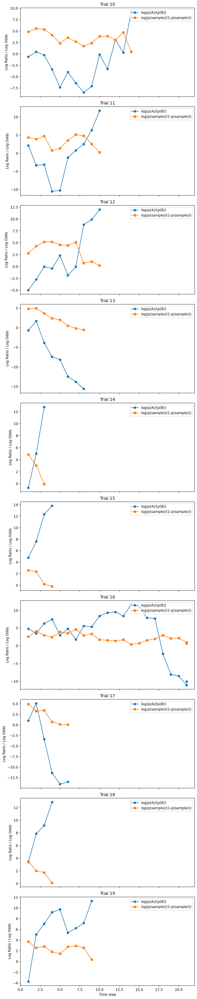

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# 1. 数据预处理
df['policy'] = df['policy'].apply(lambda x: np.array(x))
df['time_step'] = df['stimuli_so_far'].apply(len)

# 2. 选择若干 trial（这里取前 3 个）
episodes = df['episode'].unique()[10:20]

# 3. 绘图：每个 trial 一行
fig, axes = plt.subplots(len(episodes), 1, figsize=(8, 4 * len(episodes)), sharex=True)

for ax, ep in zip(axes, episodes):
    df_ep = df[df['episode'] == ep].sort_values('time_step')
    t = df_ep['time_step'].values
    pol = np.stack(df_ep['policy'].values)  # shape (T, 3)
    p_s = pol[:, 0]
    p_A = pol[:, 1]
    p_B = pol[:, 2]

    # 加小量防止除零
    eps = 1e-8
    log_ratio_AB = np.log(p_A / p_B)
    log_odds_sample = np.log(p_s / (p_A + p_B))

    ax.plot(t, log_ratio_AB, label='log(p(A)/(p(B))', marker='o')
    ax.plot(t, log_odds_sample, label='log(p(sample)/(1-p(sample)))', marker='s')

    ax.set_title(f'Trial {ep}')
    ax.set_ylabel('Log Ratio / Log Odds')
    ax.legend(loc='upper right')

axes[-1].set_xlabel('Time step')
plt.tight_layout()
plt.show()